In [181]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [182]:
df = pd.read_csv(r'C:\Users\chimi\Desktop\Python Data Science Projects\Italy Crime\unemploymentbyprovincebygender2011-2022.csv')

In [183]:
df.head(5)

,Country,Gender_ID,Gender,Time_Period,NationalUNEM_R,Lower_Age,Upper_Age,Province,RegionalUNEM_R
0,Italy,1,males,2011-Q1,27.731503,15,24,Nord,17.770927
1,Italy,1,males,2011-Q1,27.731503,15,24,Nord-ovest,19.687084
2,Italy,1,males,2011-Q1,27.731503,15,24,Nord-est,15.035054
3,Italy,1,males,2011-Q1,27.731503,15,24,Centro (I),28.585316
4,Italy,1,males,2011-Q1,27.731503,15,24,Mezzogiorno,39.233417


In [184]:
df.tail(5)

,Country,Gender_ID,Gender,Time_Period,NationalUNEM_R,Lower_Age,Upper_Age,Province,RegionalUNEM_R
6475,Italy,2,females,2022-Q4,8.872579,20,64,Campania,19.724541
6476,Italy,2,females,2022-Q4,8.872579,20,64,Puglia,16.744276
6477,Italy,2,females,2022-Q4,8.872579,20,64,Provincia Autonoma Bolzano / Bozen,3.172621
6478,Italy,2,females,2022-Q4,8.872579,20,64,Liguria,6.662832
6479,Italy,2,females,2022-Q4,8.872579,20,64,Lombardia,5.109508


In [185]:
# Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6480 entries, 0 to 6479
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country         6480 non-null   object 
 1   Gender_ID       6480 non-null   int64  
 2   Gender          6480 non-null   object 
 3   Time_Period     6480 non-null   object 
 4   NationalUNEM_R  6480 non-null   float64
 5   Lower_Age       6480 non-null   int64  
 6   Upper_Age       6480 non-null   int64  
 7   Province        6480 non-null   object 
 8   RegionalUNEM_R  6480 non-null   float64
dtypes: float64(2), int64(3), object(4)
memory usage: 455.8+ KB


In [186]:
# Columns
df.columns

Index(['Country', 'Gender_ID', 'Gender', 'Time_Period', 'NationalUNEM_R',
       'Lower_Age', 'Upper_Age', 'Province', 'RegionalUNEM_R'],
      dtype='object')

In [187]:
# Duplicates
df.duplicated().sum()

0

In [188]:
# Check for missing values
df.isnull().sum()

Country           0
Gender_ID         0
Gender            0
Time_Period       0
NationalUNEM_R    0
Lower_Age         0
Upper_Age         0
Province          0
RegionalUNEM_R    0
dtype: int64

In [189]:
# Age_Range for easier analysis
# However, it's better to divide it up during modeling
df['age_range'] = df['Lower_Age'].astype(str) + '-' + df['Upper_Age'].astype(str)

In [190]:
# Extract Year and Quarter
df[['Year', 'Quarter']] = df['Time_Period'].str.split('-Q', expand=True).astype(int)

In [191]:
# Rename the columns to provinces
df.rename(columns={'RegionalUNEM_R':'ProvinceUNEM_R'}, inplace=True)

In [192]:
df.head(5)

,Country,Gender_ID,Gender,Time_Period,NationalUNEM_R,Lower_Age,Upper_Age,Province,ProvinceUNEM_R,age_range,Year,Quarter
0,Italy,1,males,2011-Q1,27.731503,15,24,Nord,17.770927,15-24,2011,1
1,Italy,1,males,2011-Q1,27.731503,15,24,Nord-ovest,19.687084,15-24,2011,1
2,Italy,1,males,2011-Q1,27.731503,15,24,Nord-est,15.035054,15-24,2011,1
3,Italy,1,males,2011-Q1,27.731503,15,24,Centro (I),28.585316,15-24,2011,1
4,Italy,1,males,2011-Q1,27.731503,15,24,Mezzogiorno,39.233417,15-24,2011,1


<Axes: xlabel='Year', ylabel='NationalUNEM_R'>

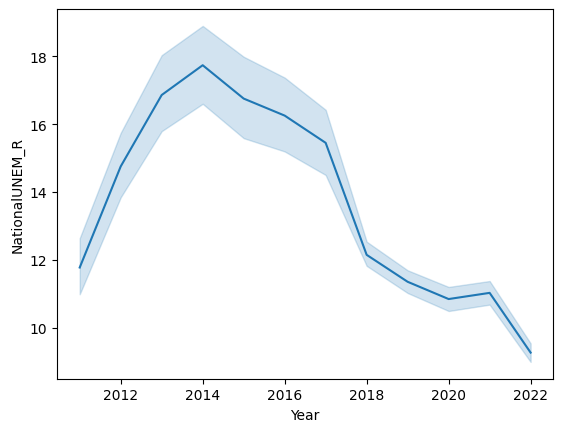

In [193]:
# What is the unemployment rate for the period between 2011 and 2020?
sns.lineplot(x='Year', y='NationalUNEM_R',data=df)

<Axes: xlabel='Year', ylabel='NationalUNEM_R'>

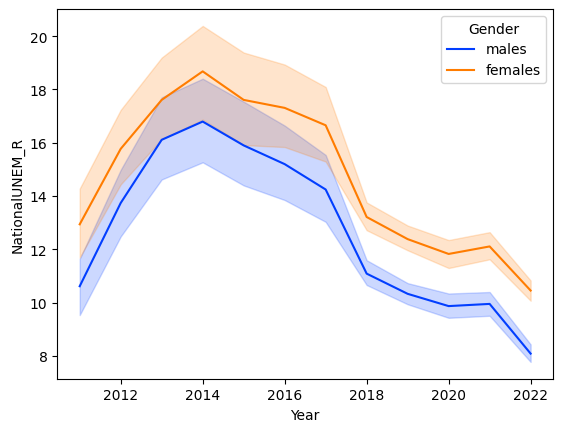

In [194]:
# What is the unemployment rate for the period between 2011 and 2020 by gender?
sns.lineplot(x='Year', y='NationalUNEM_R',data=df, hue='Gender', palette='bright')

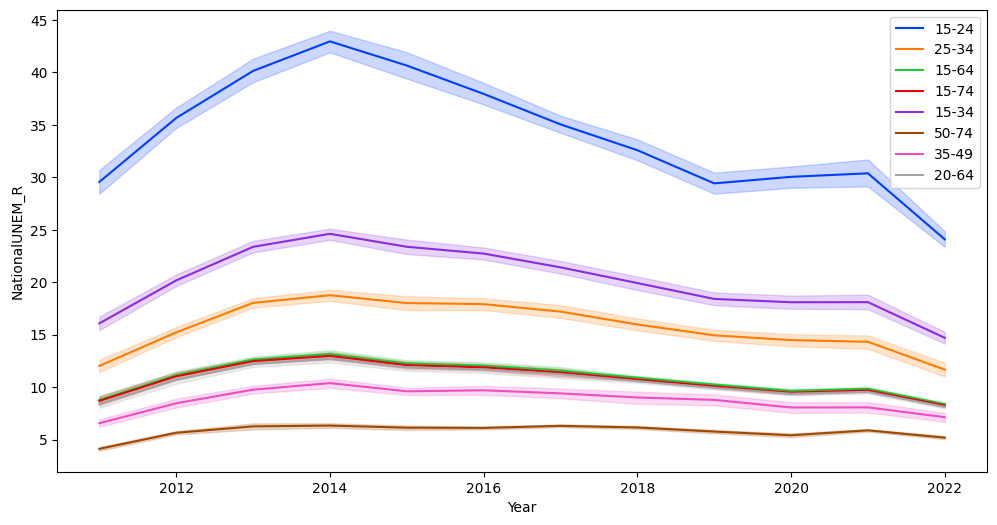

In [195]:
# What is the unemployment rate for the period between 2011 and 2020 by various age groups?
plt.figure(figsize=(12,6))
sns.lineplot(x='Year', y='NationalUNEM_R',data=df, hue='age_range', palette='bright')
plt.legend(bbox_to_anchor=(1, 1), loc='upper right')

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\4134778737.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='NationalUNEM_R', x='Gender', data=df, ci=None, palette='bright')


<Axes: xlabel='Gender', ylabel='NationalUNEM_R'>

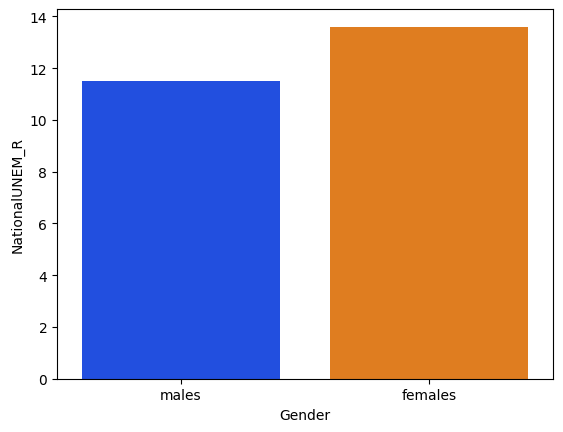

In [196]:
# Which gender generally has a higher seasonal unemployment rate overall?
sns.barplot(y='NationalUNEM_R', x='Gender', data=df, ci=None, palette='bright')

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1229794281.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='NationalUNEM_R', x='age_range', data=df, ci=None, palette='bright')


<Axes: xlabel='age_range', ylabel='NationalUNEM_R'>

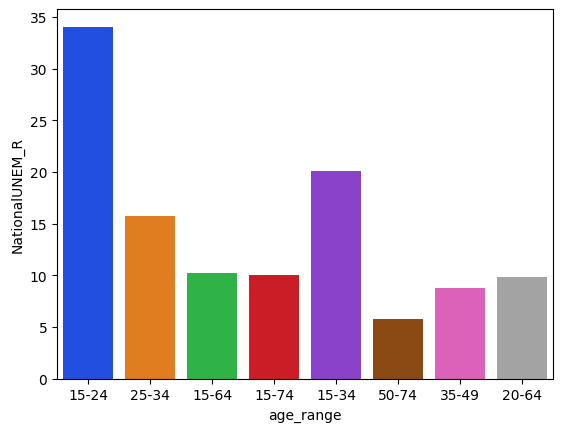

In [197]:
# Which age-groups generally has a higher seasonal unemployment rate overall?
sns.barplot(y='NationalUNEM_R', x='age_range', data=df, ci=None, palette='bright')

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\206190737.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='NationalUNEM_R', x='age_range', hue='Gender' , data=df, ci=None, palette='bright')


<Axes: xlabel='age_range', ylabel='NationalUNEM_R'>

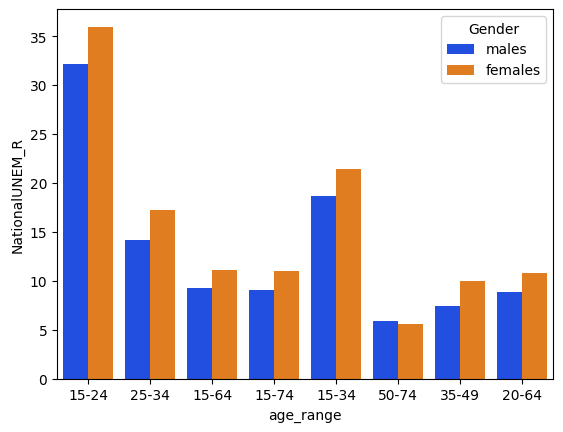

In [198]:
# How does the national seasonal unemployment rate vary across different age groups, separated by gender?
sns.barplot(y='NationalUNEM_R', x='age_range', hue='Gender' , data=df, ci=None, palette='bright')

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\712613356.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='Quarter', y='NationalUNEM_R', data=year_df,palette='bright')


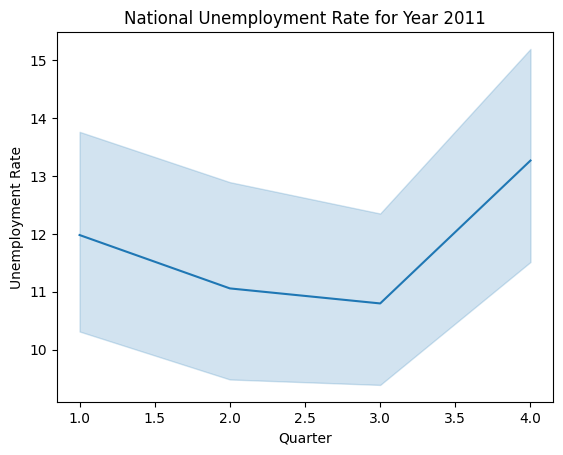

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\712613356.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='Quarter', y='NationalUNEM_R', data=year_df,palette='bright')


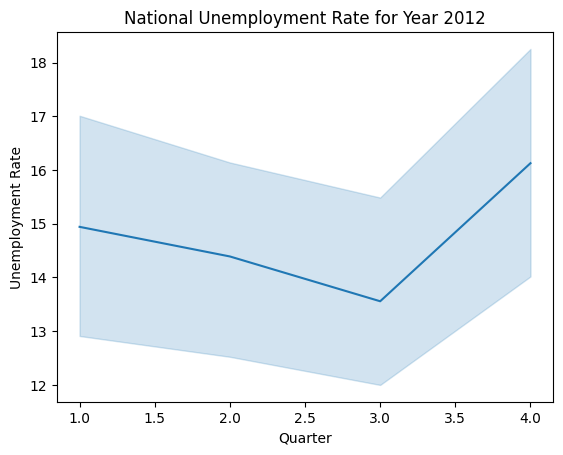

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\712613356.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='Quarter', y='NationalUNEM_R', data=year_df,palette='bright')


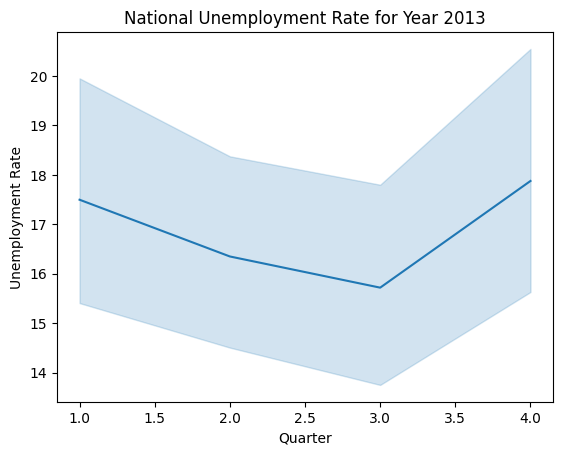

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\712613356.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='Quarter', y='NationalUNEM_R', data=year_df,palette='bright')


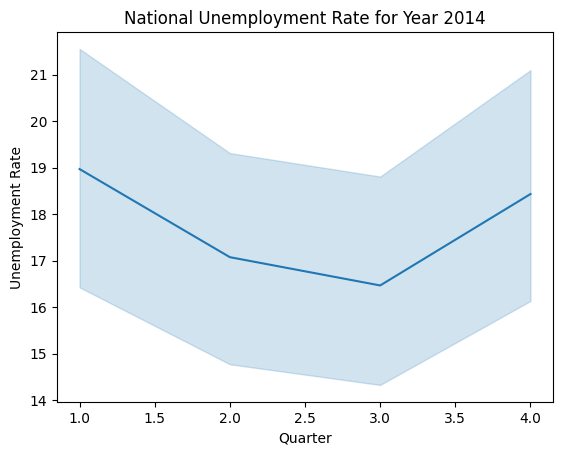

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\712613356.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='Quarter', y='NationalUNEM_R', data=year_df,palette='bright')


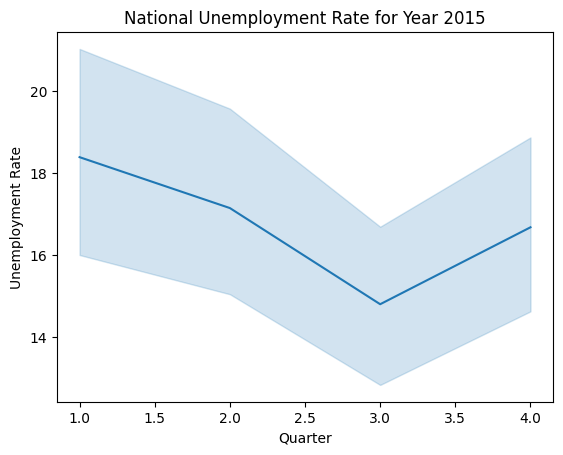

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\712613356.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='Quarter', y='NationalUNEM_R', data=year_df,palette='bright')


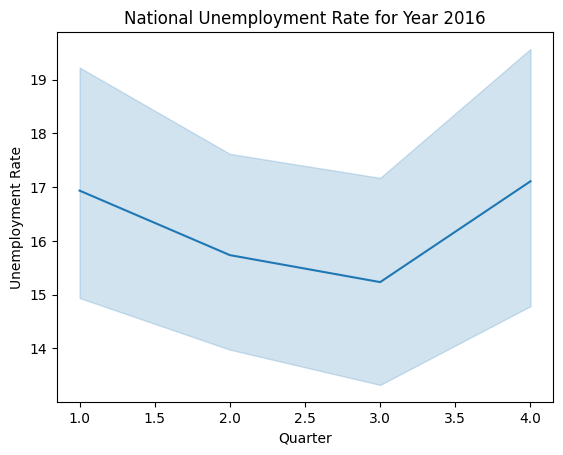

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\712613356.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='Quarter', y='NationalUNEM_R', data=year_df,palette='bright')


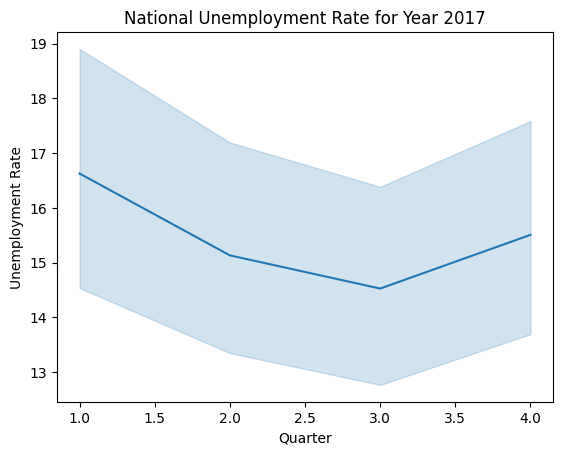

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\712613356.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='Quarter', y='NationalUNEM_R', data=year_df,palette='bright')


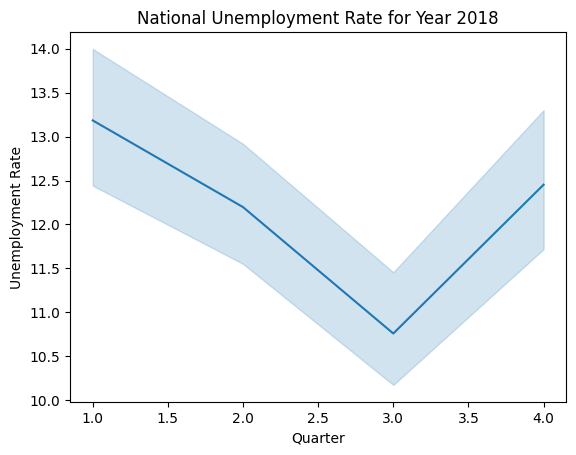

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\712613356.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='Quarter', y='NationalUNEM_R', data=year_df,palette='bright')


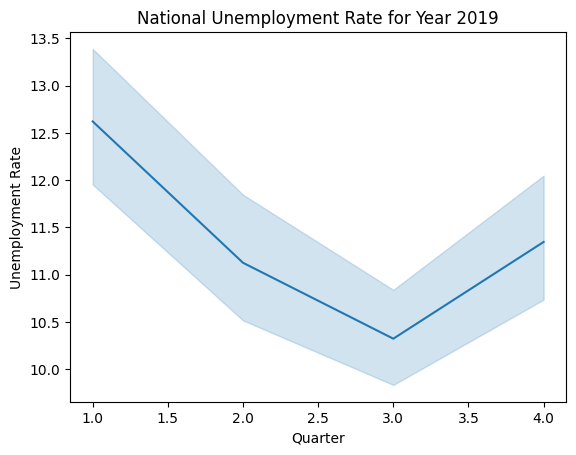

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\712613356.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='Quarter', y='NationalUNEM_R', data=year_df,palette='bright')


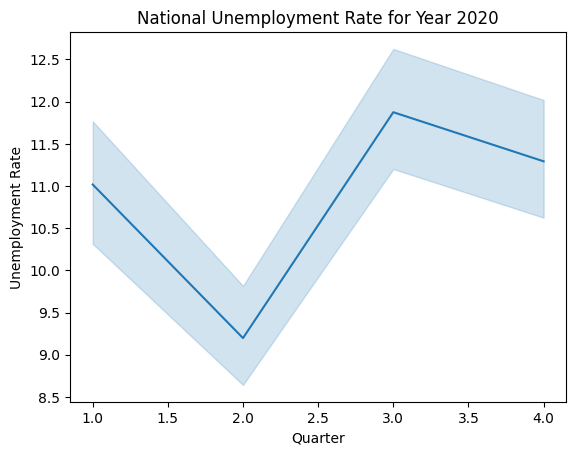

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\712613356.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='Quarter', y='NationalUNEM_R', data=year_df,palette='bright')


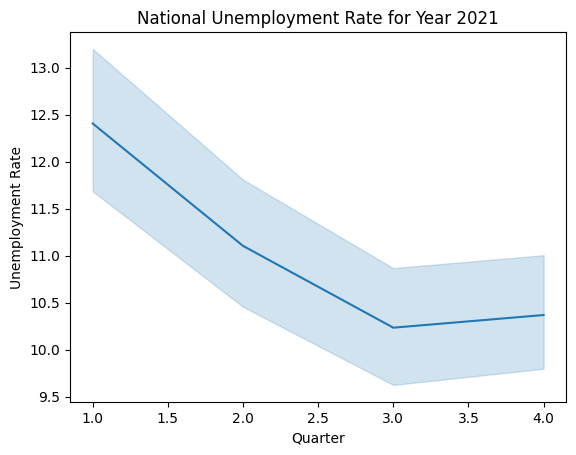

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\712613356.py:12: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x='Quarter', y='NationalUNEM_R', data=year_df,palette='bright')


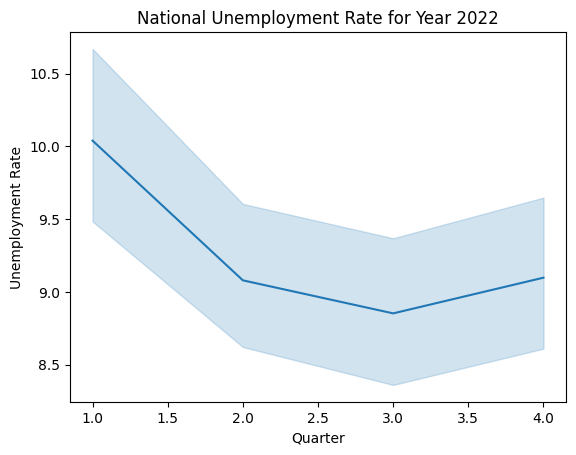

In [142]:
# What is the seasonal national unemployment trend year-wise?
# Get unique years from the 'Year' column
years = df['Year'].unique()

# Loop through each year and create a line plot
for year in years:
    # Filter the dataframe for the current year
    year_df = df[df['Year'] == year]
    
    # Create the line plot
    plt.figure()
    sns.lineplot(x='Quarter', y='NationalUNEM_R', data=year_df,palette='bright')
    plt.title(f'National Unemployment Rate for Year {year}')
    plt.xlabel('Quarter')
    plt.ylabel('Unemployment Rate')
    plt.show()

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


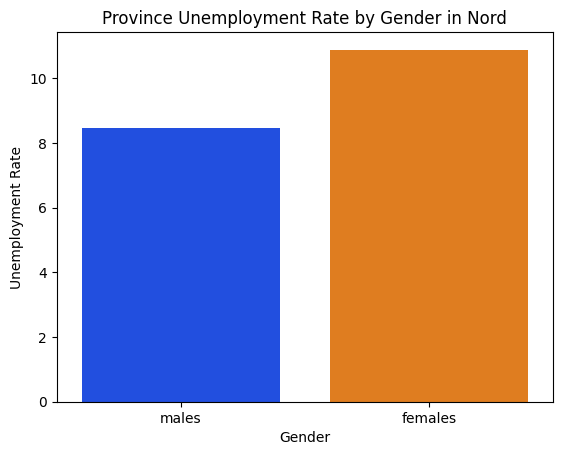

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


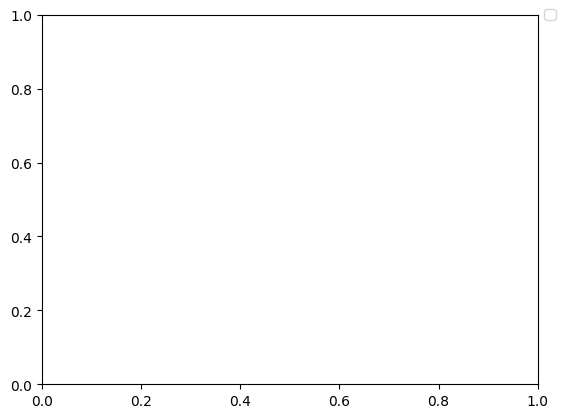

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


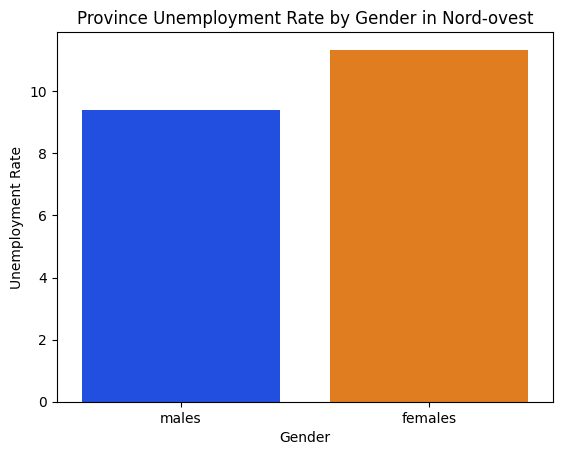

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


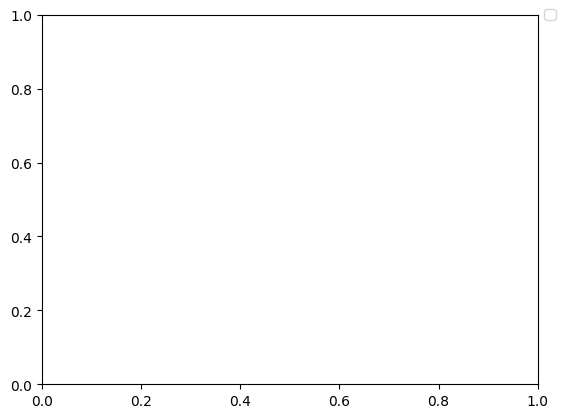

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


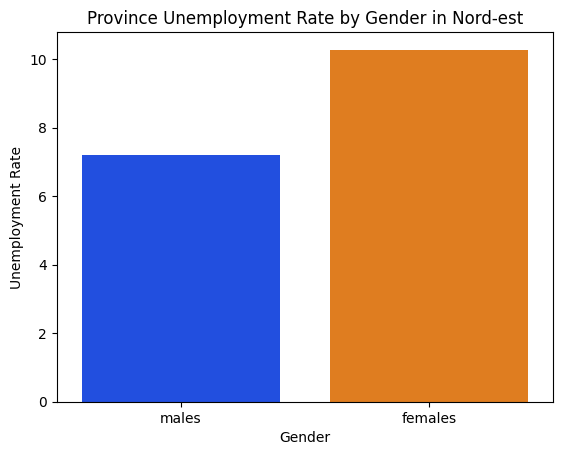

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


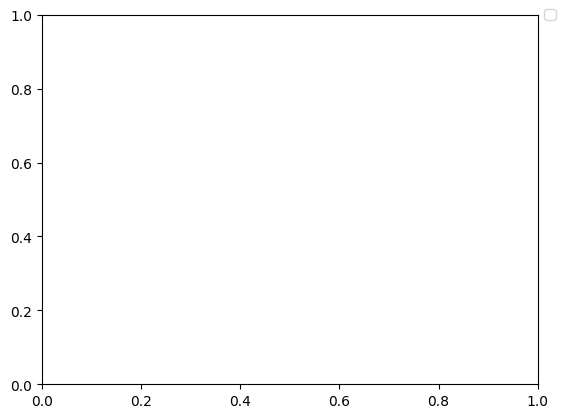

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


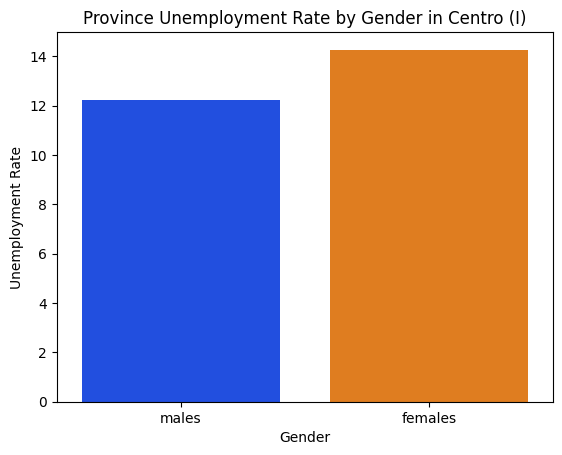

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


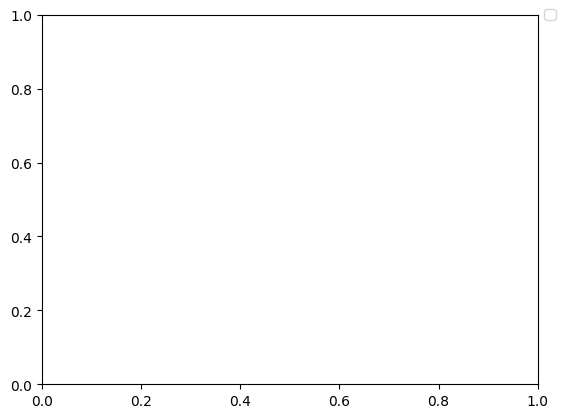

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


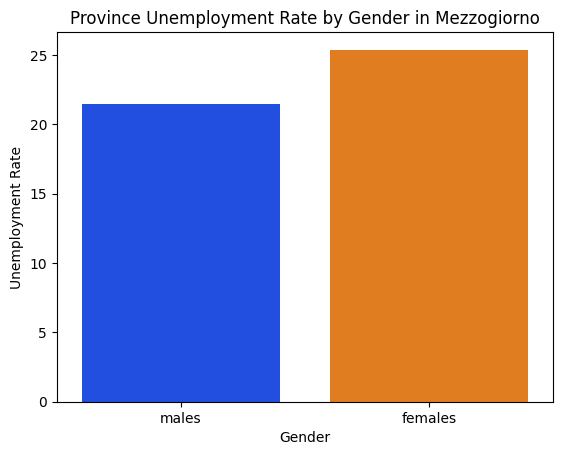

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


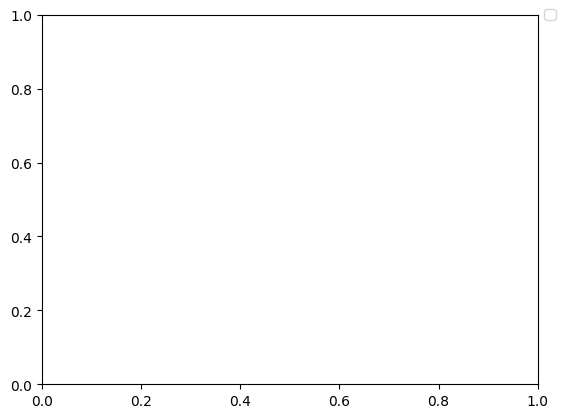

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


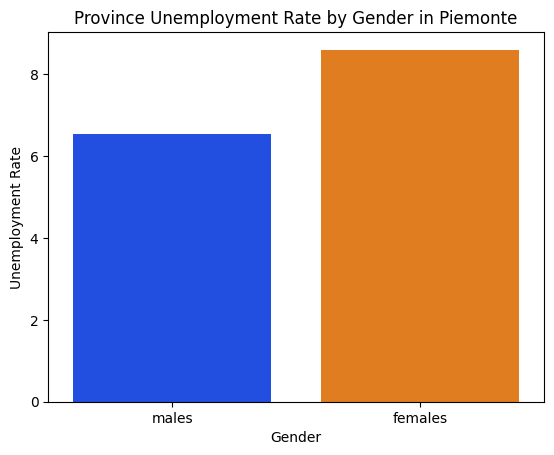

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


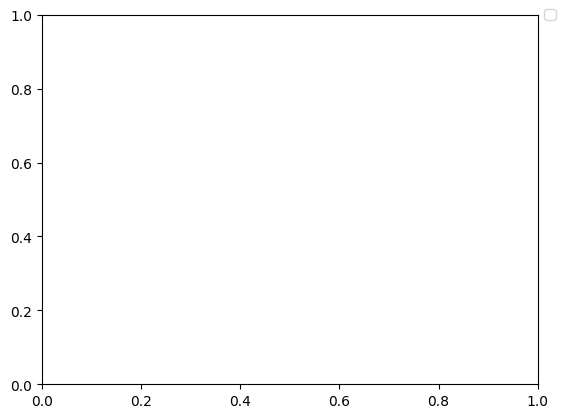

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


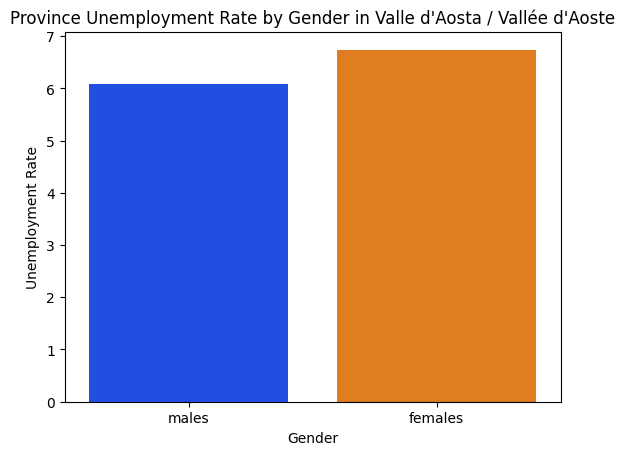

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


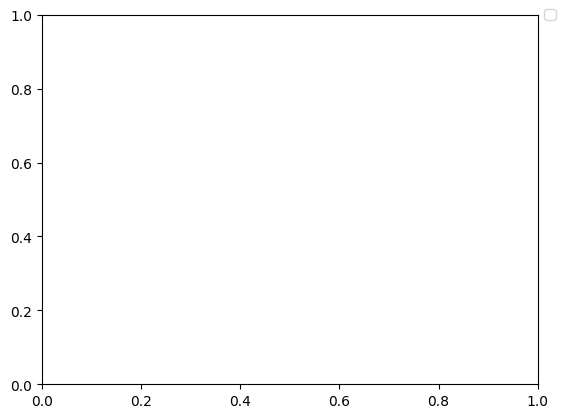

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


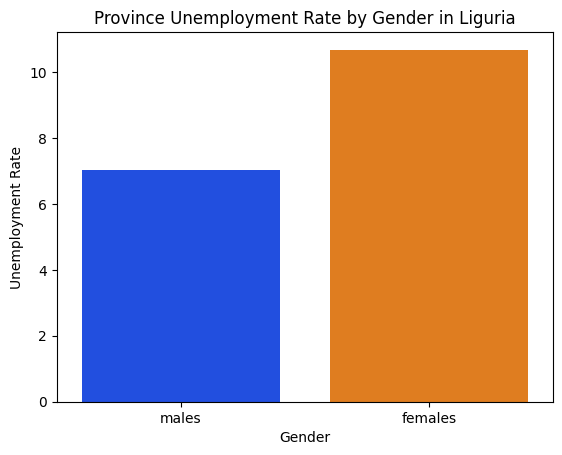

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


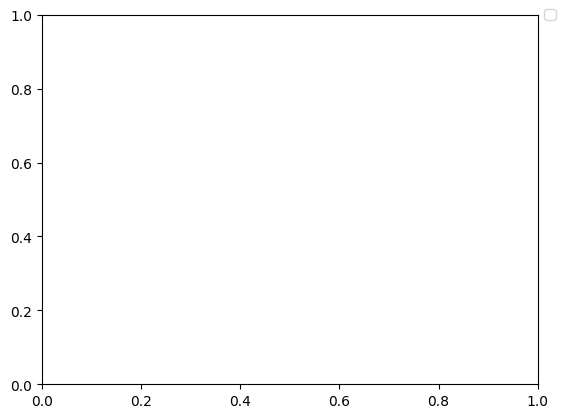

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


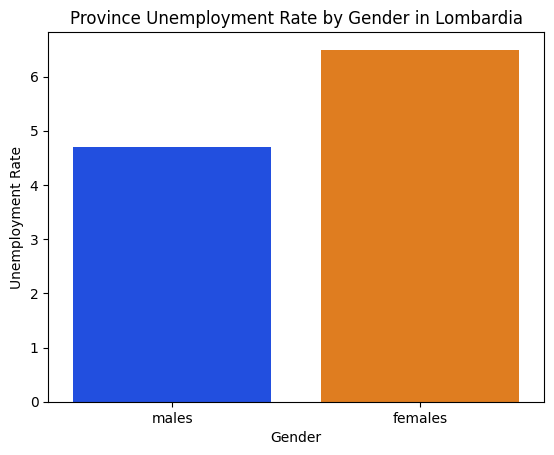

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


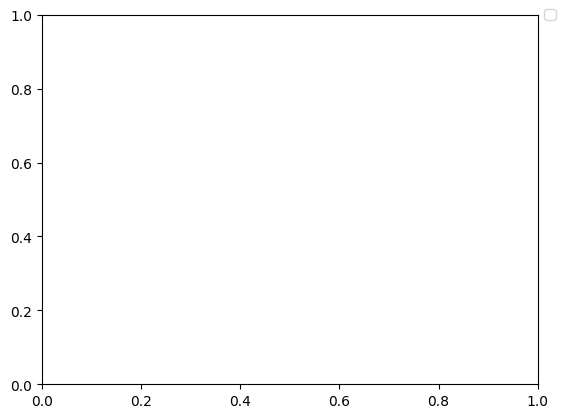

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


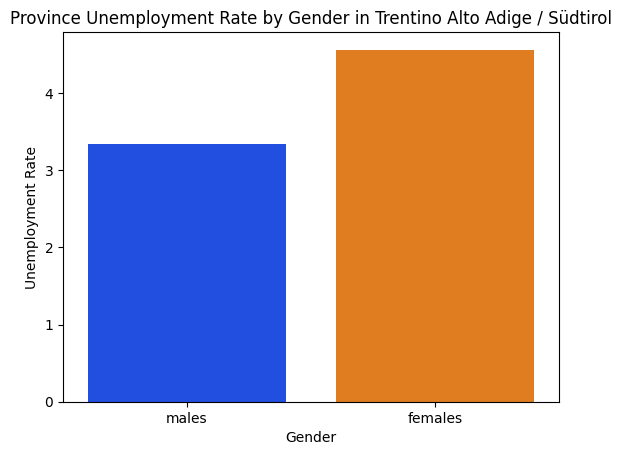

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


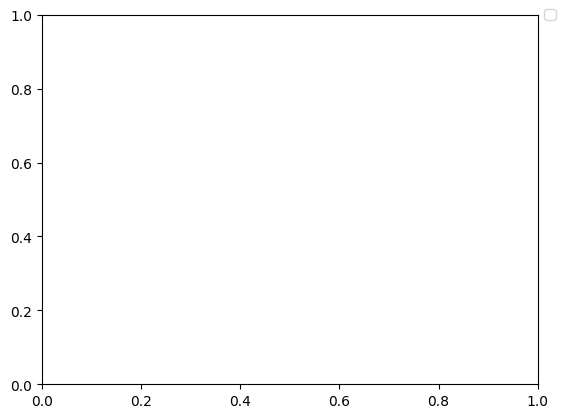

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


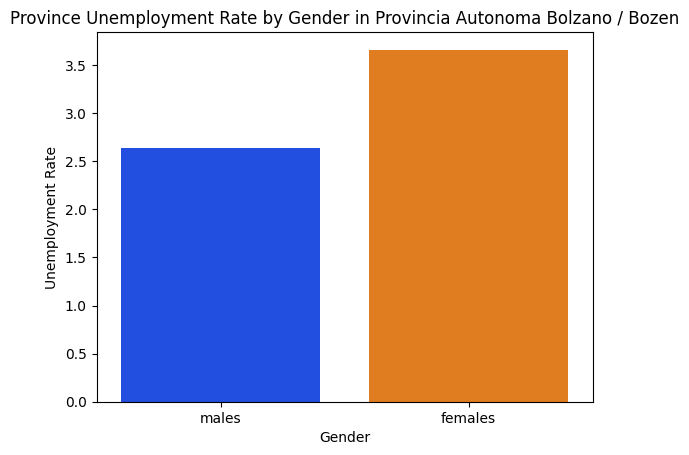

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


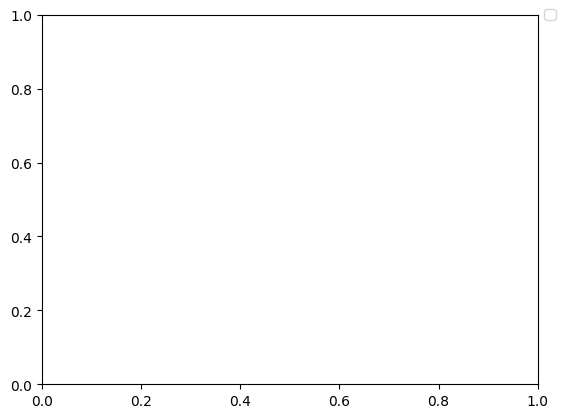

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


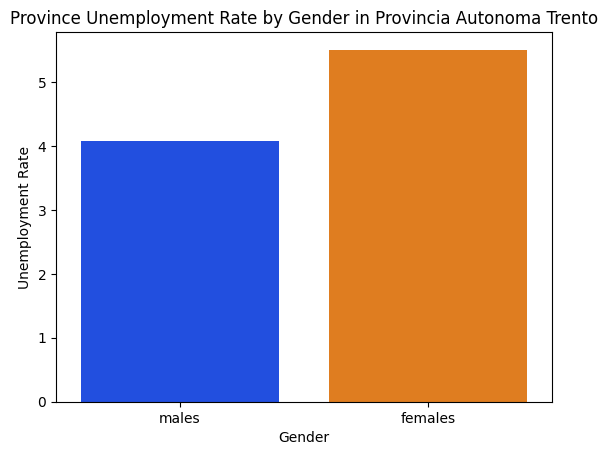

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


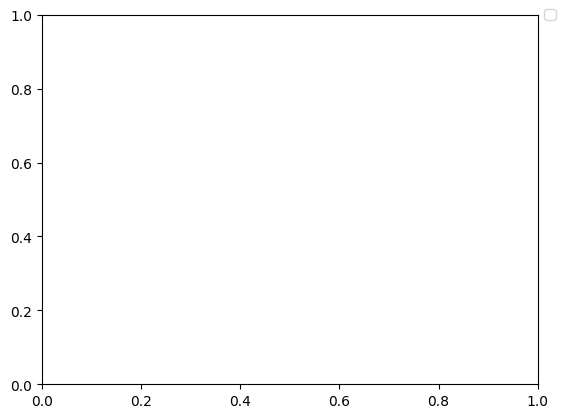

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


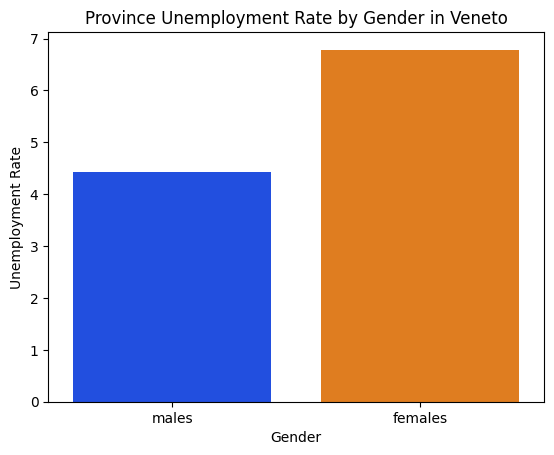

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


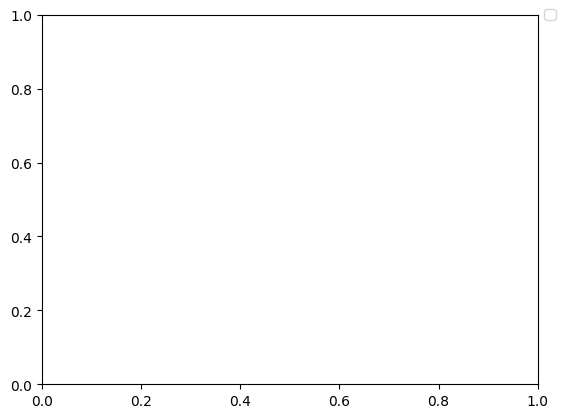

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


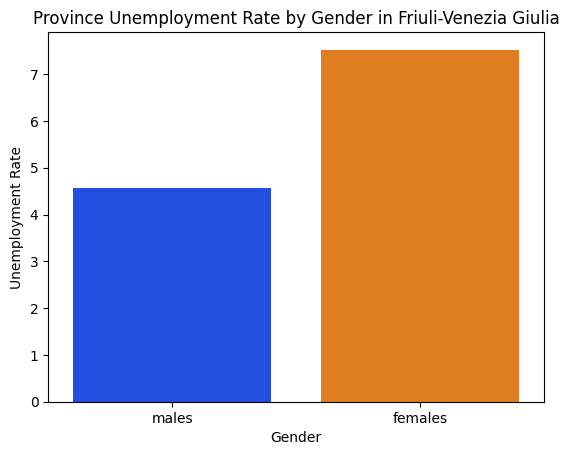

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


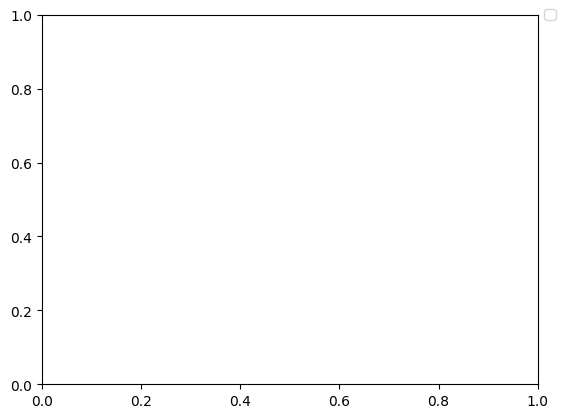

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


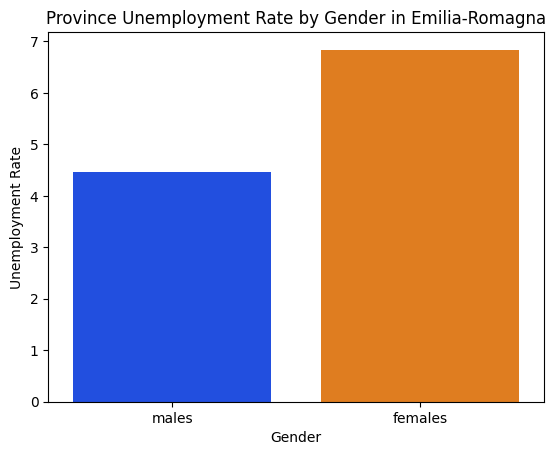

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


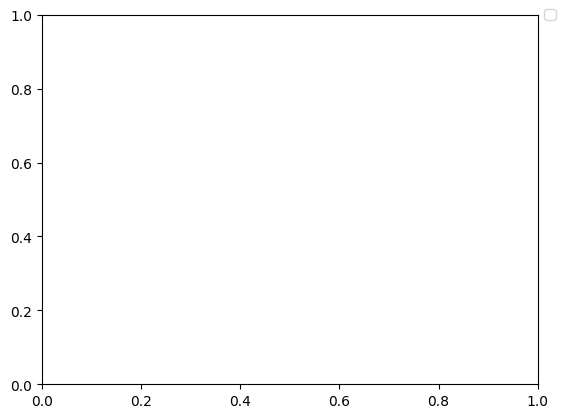

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


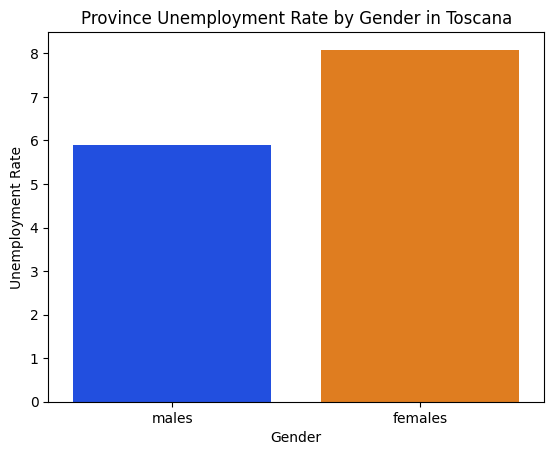

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


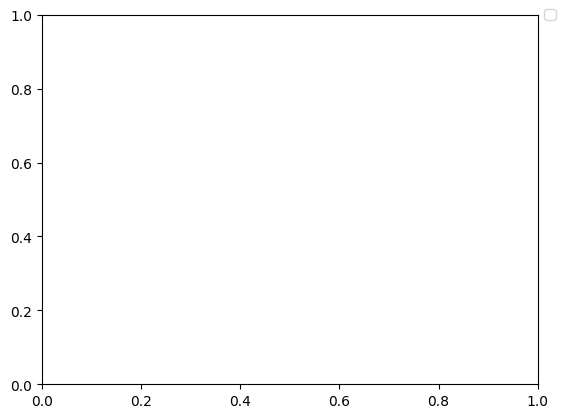

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


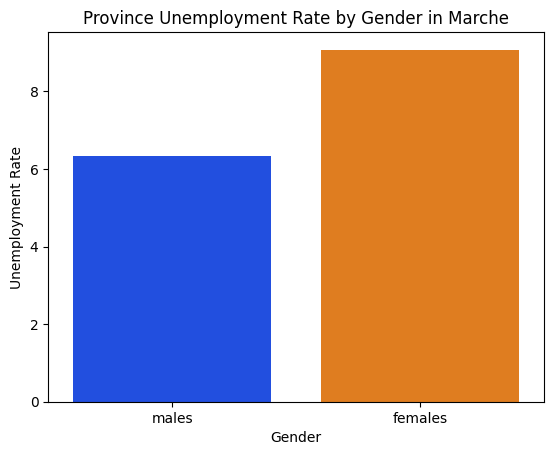

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


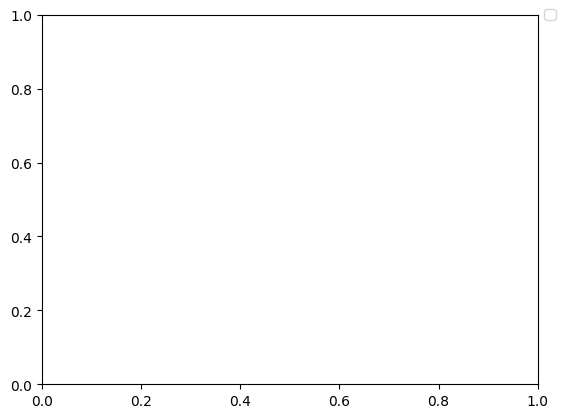

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


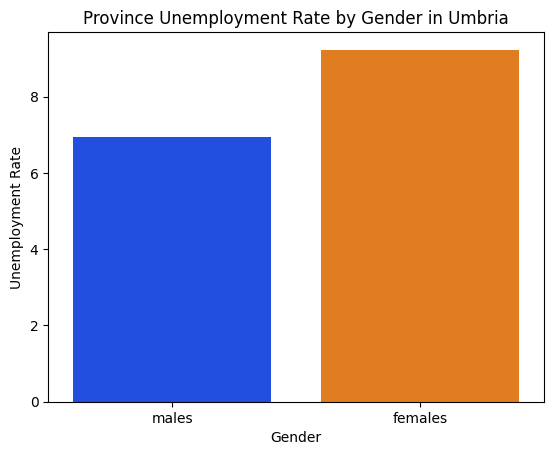

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


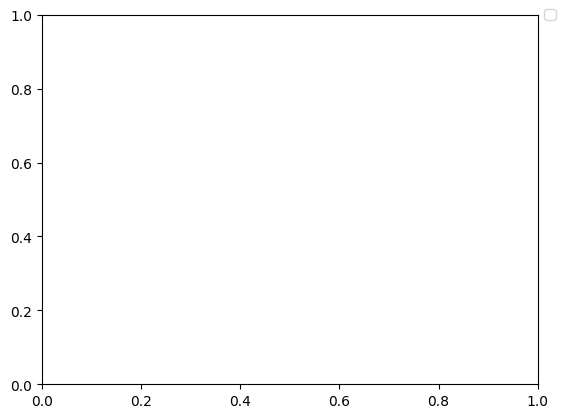

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


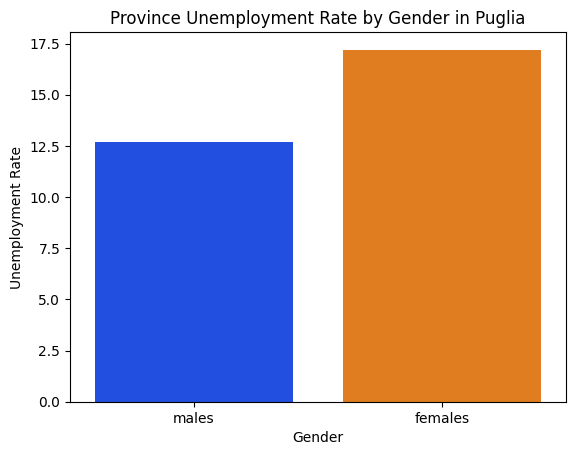

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


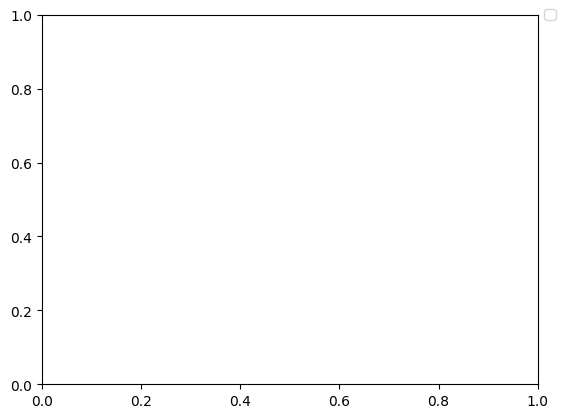

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


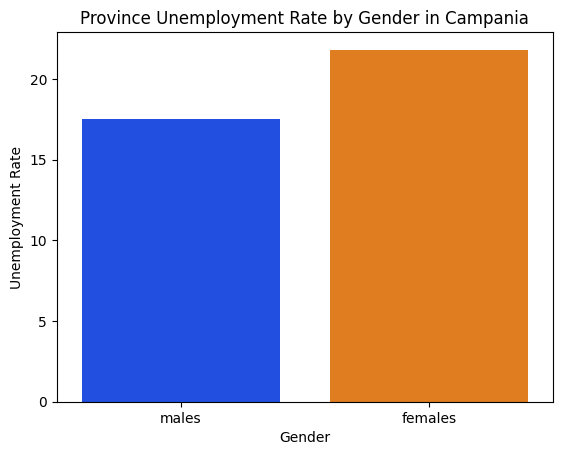

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


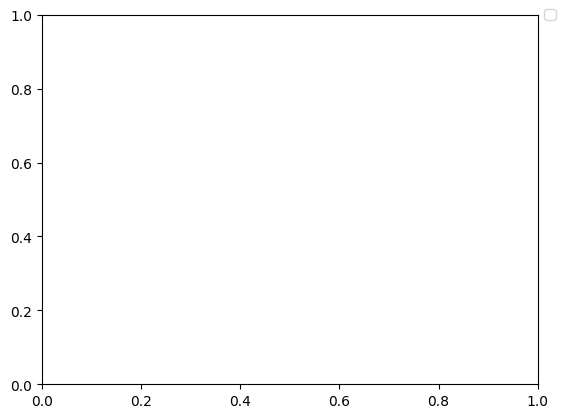

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


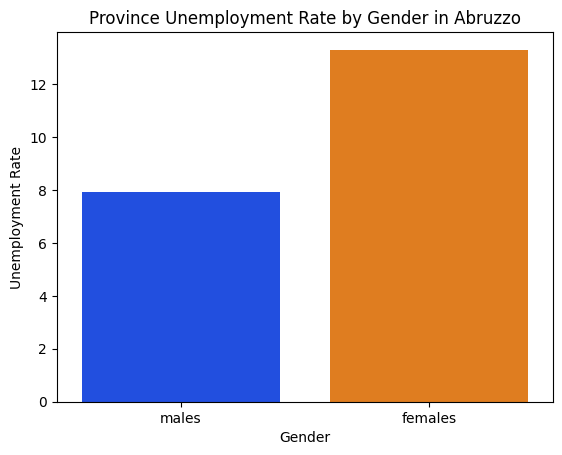

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


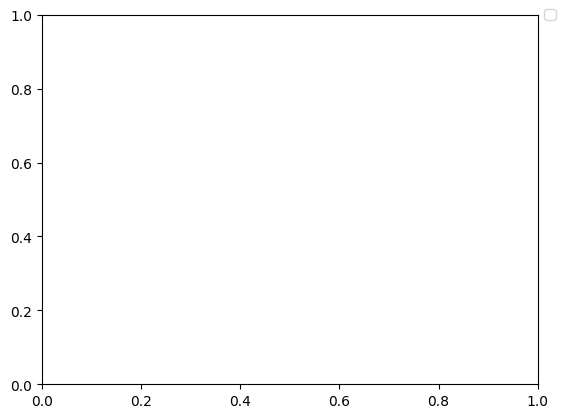

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


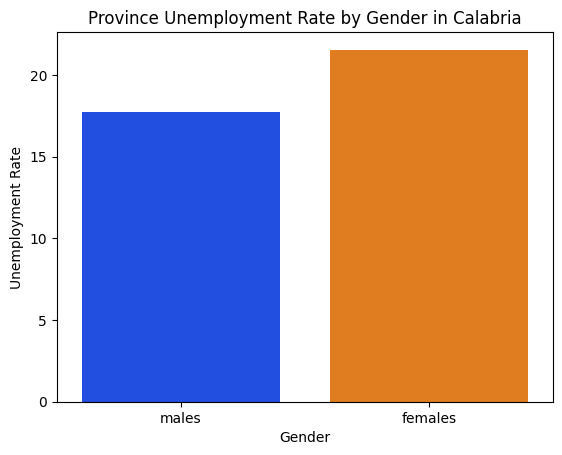

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


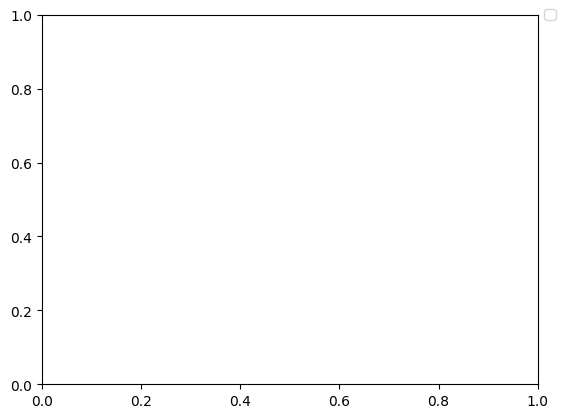

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


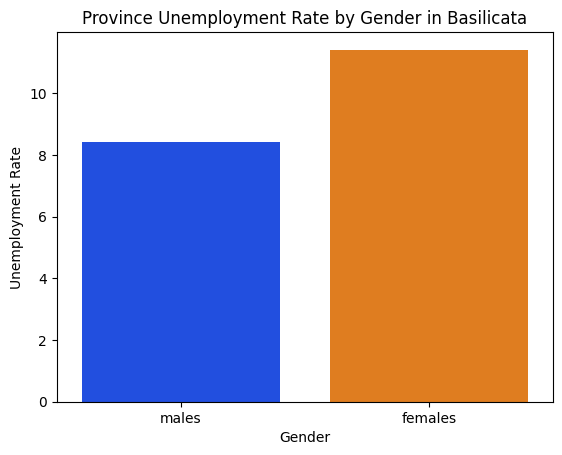

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


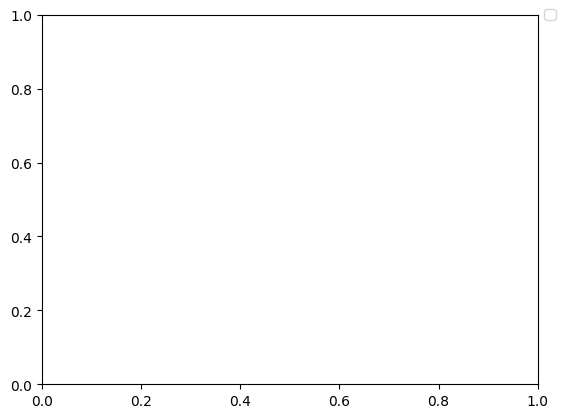

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


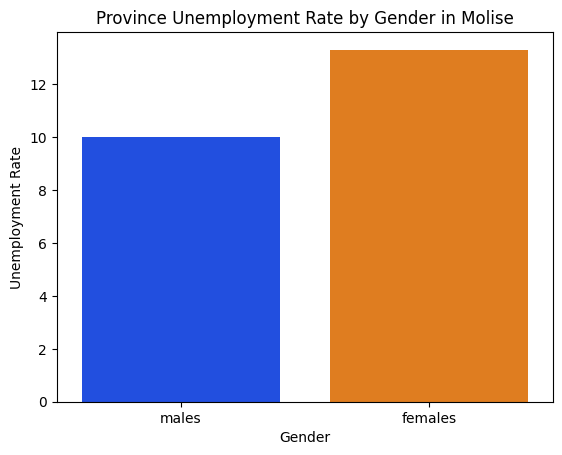

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


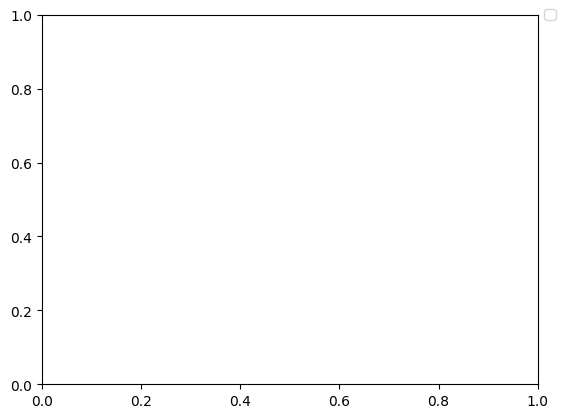

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


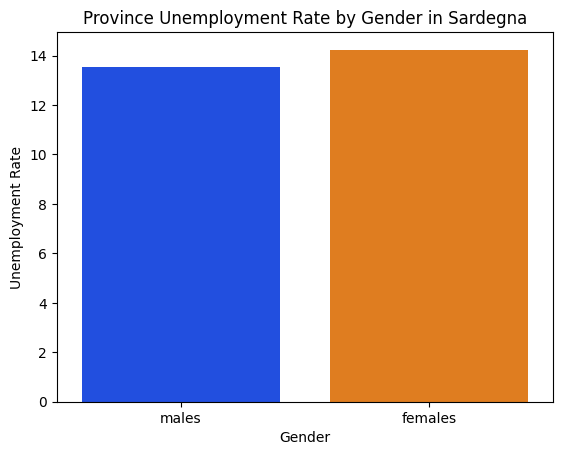

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


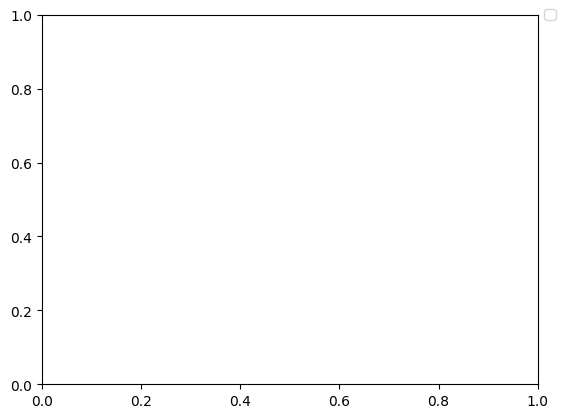

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


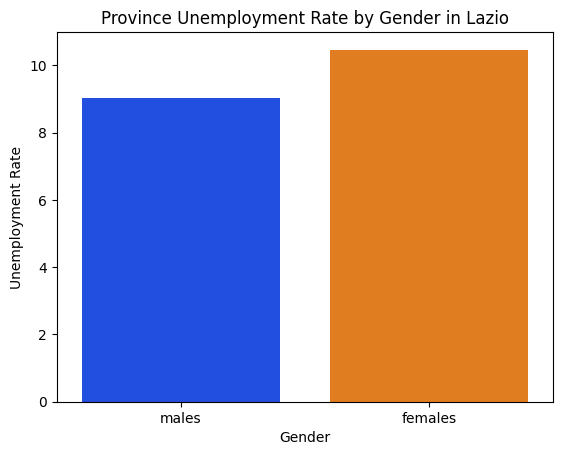

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


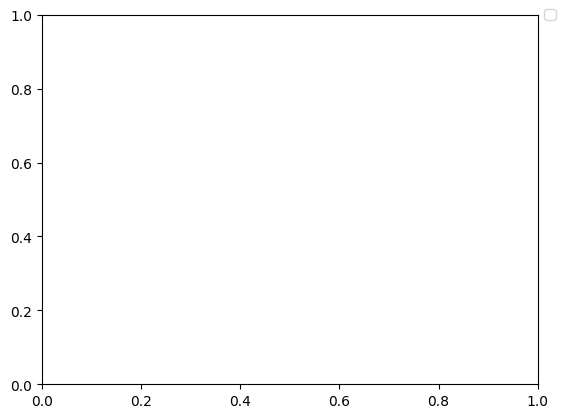

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\751387219.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')


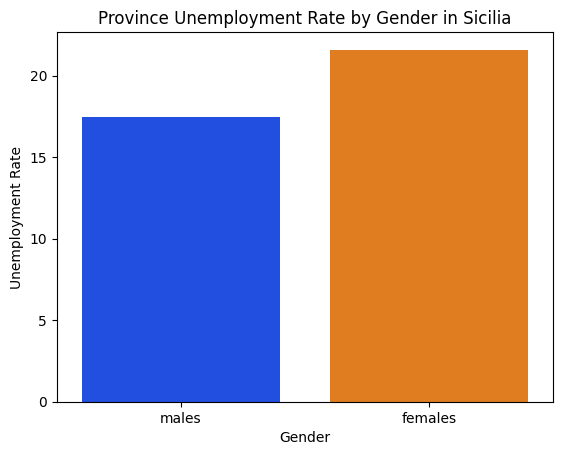

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


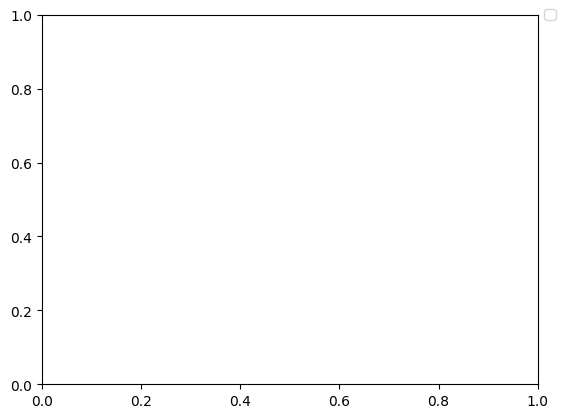

In [199]:
# Which gender generally has a higher seasonal unemployment rate overall in each province?

province_names = df['Province'].unique()

# Loop through each province and create the barplot
for province in province_names:
    # Filter the dataframe for the current province
    province_df = df[df['Province'] == province]
    
    # Create the barplot
    plt.figure()
    sns.barplot(y='ProvinceUNEM_R', x='Gender',data=province_df, ci=None, palette='bright')
    plt.title(f'Province Unemployment Rate by Gender in {province}')
    plt.xlabel('Gender')
    plt.ylabel('Unemployment Rate')
    plt.show()
     # Move the legend to the right side of the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='right')
    
    plt.show()

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


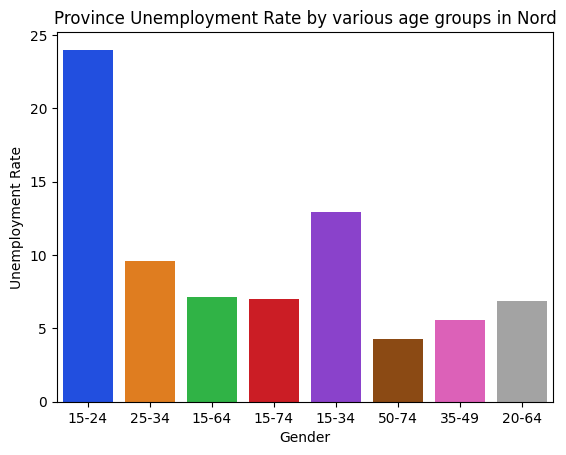

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


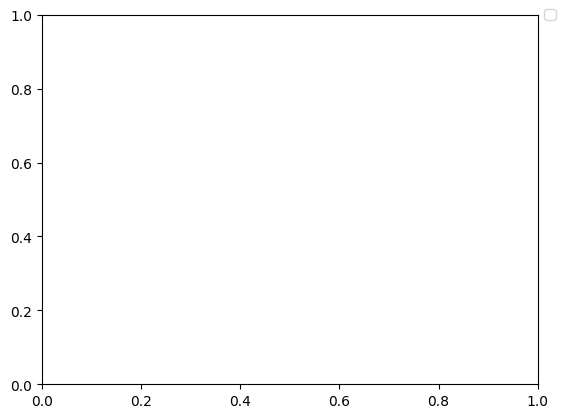

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


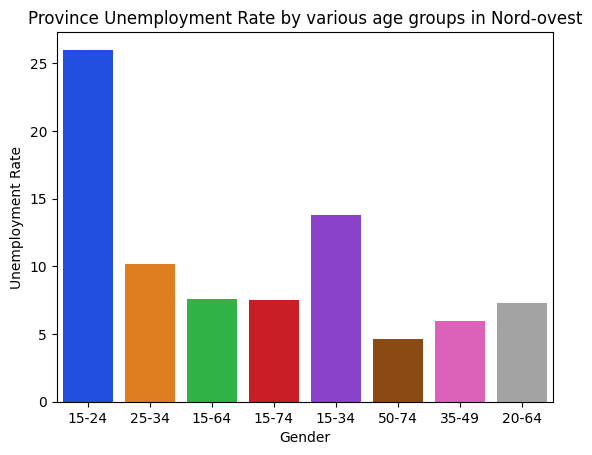

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


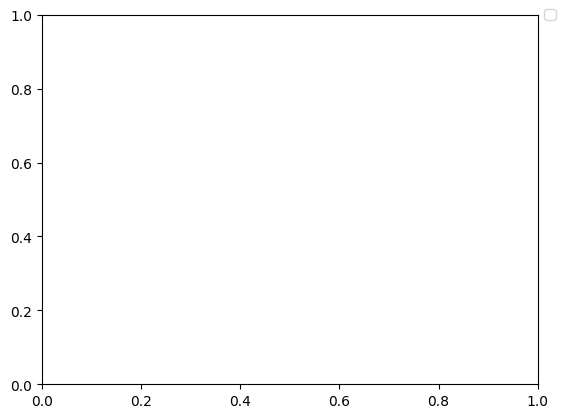

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


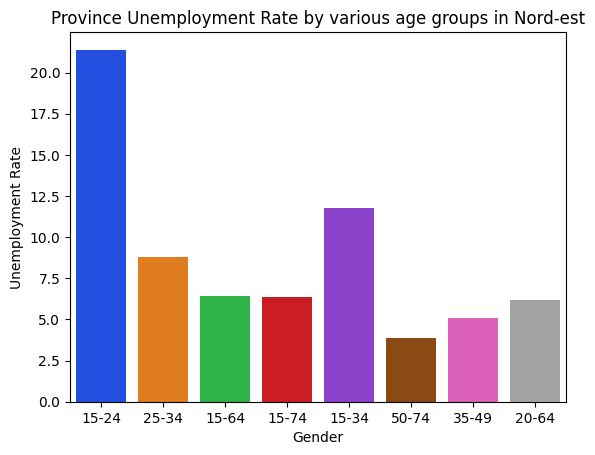

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


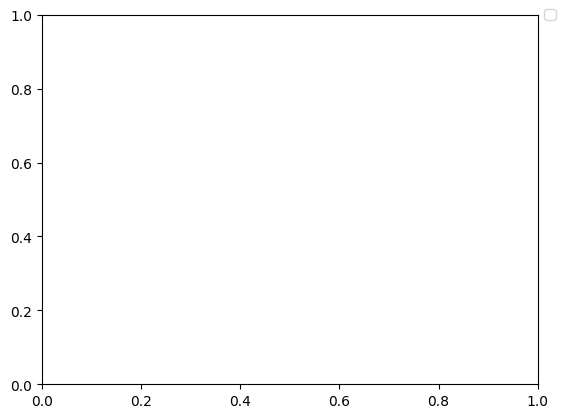

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


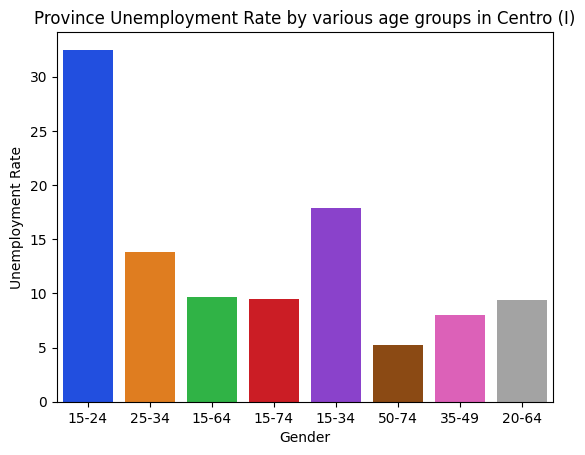

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


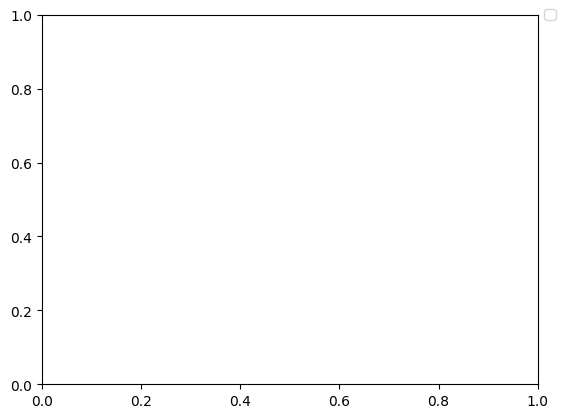

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


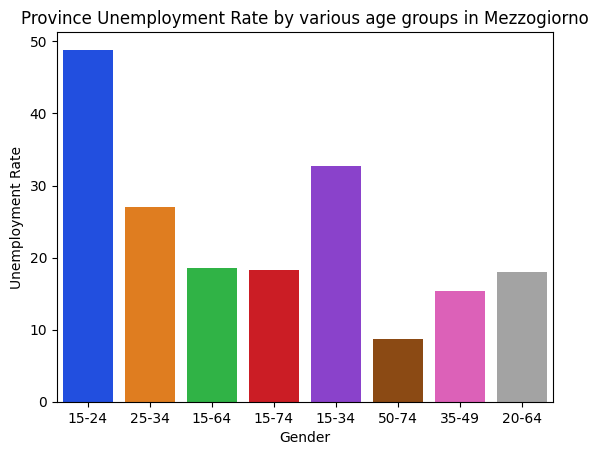

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


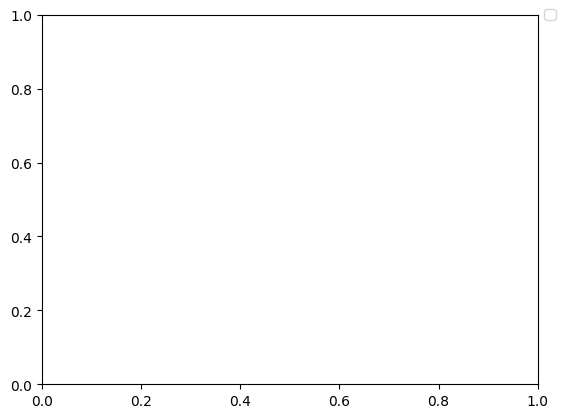

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


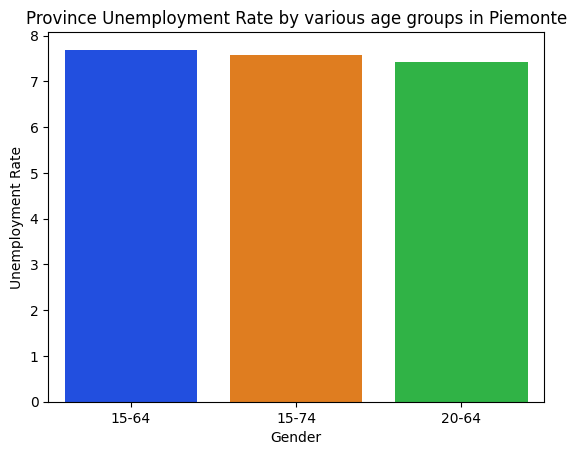

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


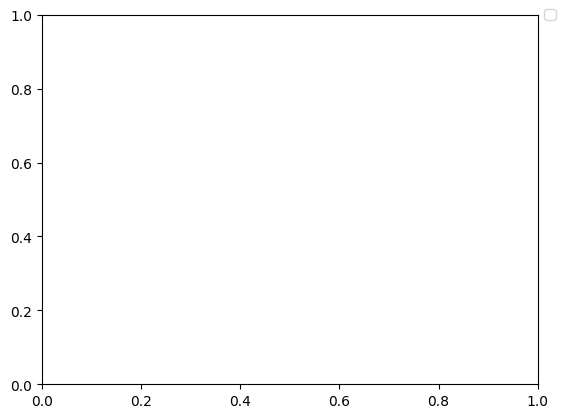

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


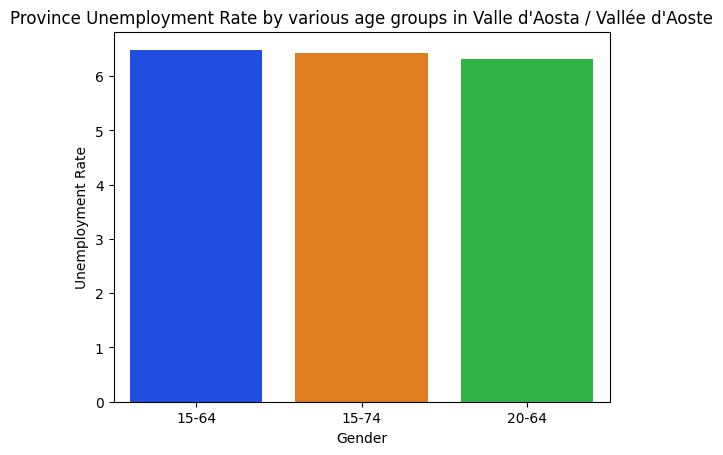

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


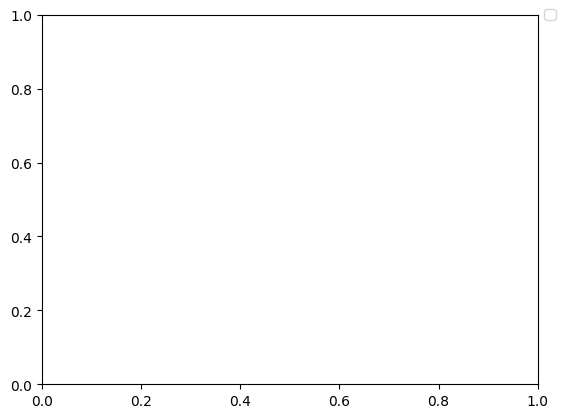

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


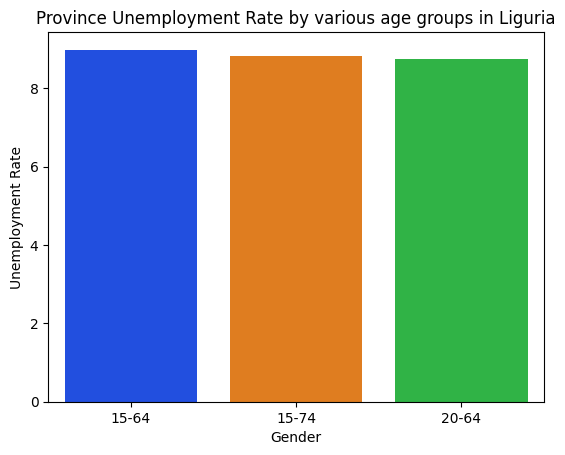

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


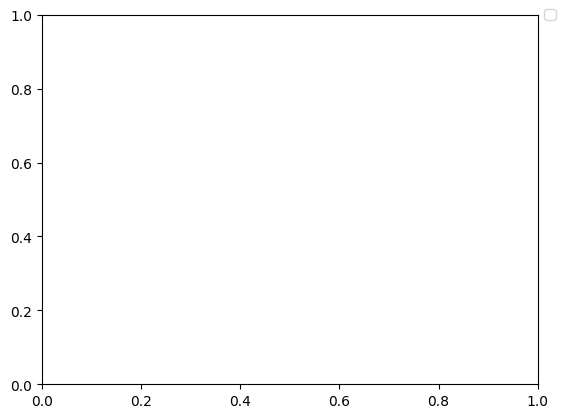

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


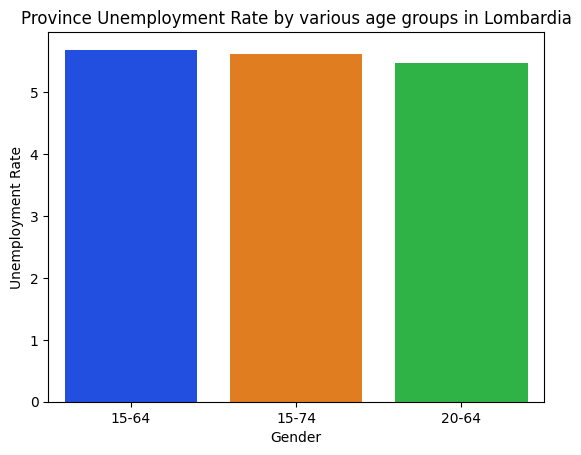

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


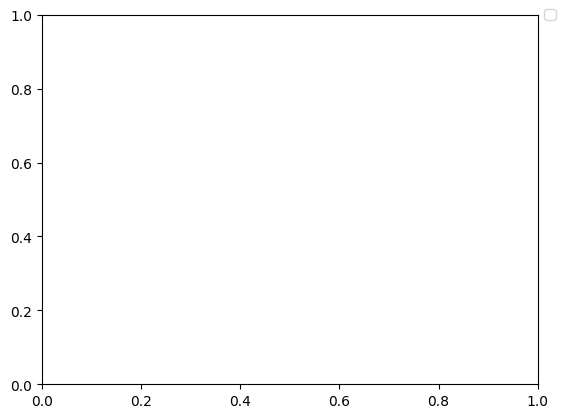

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


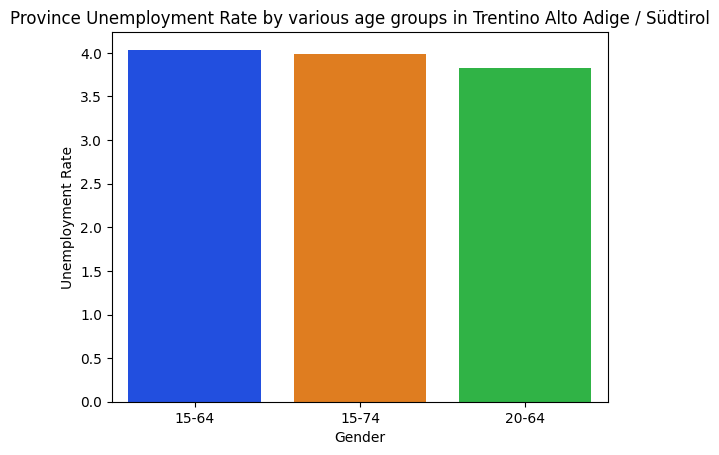

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


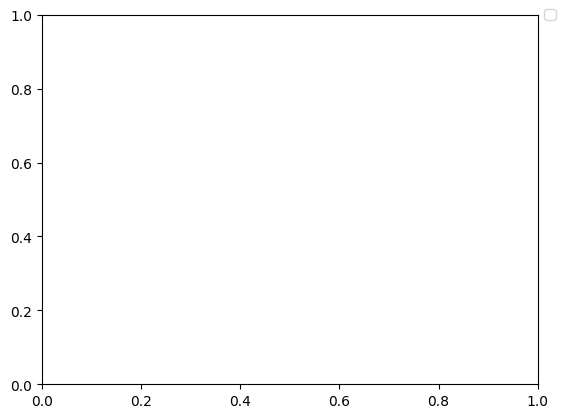

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


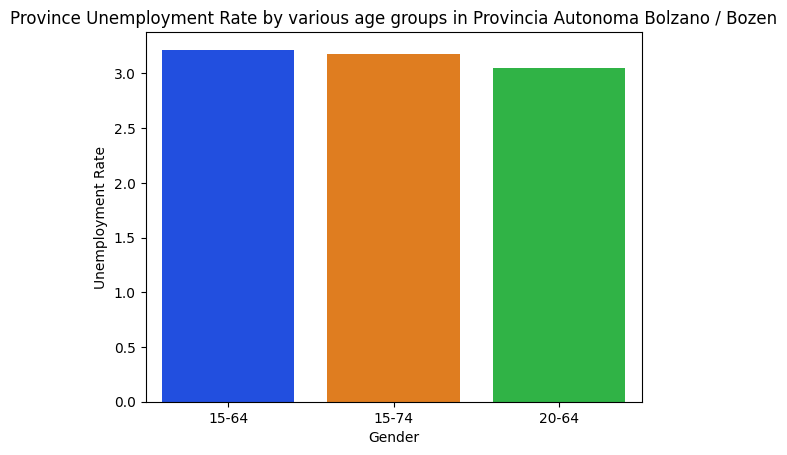

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


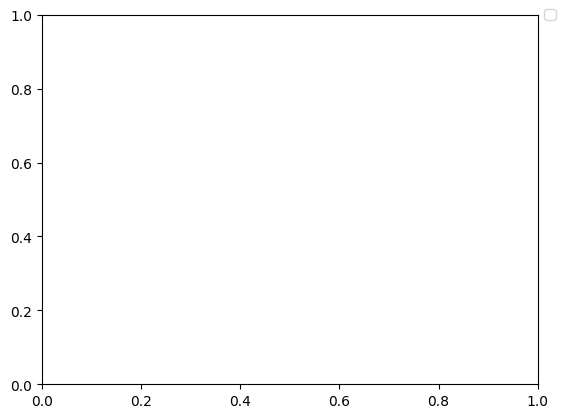

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


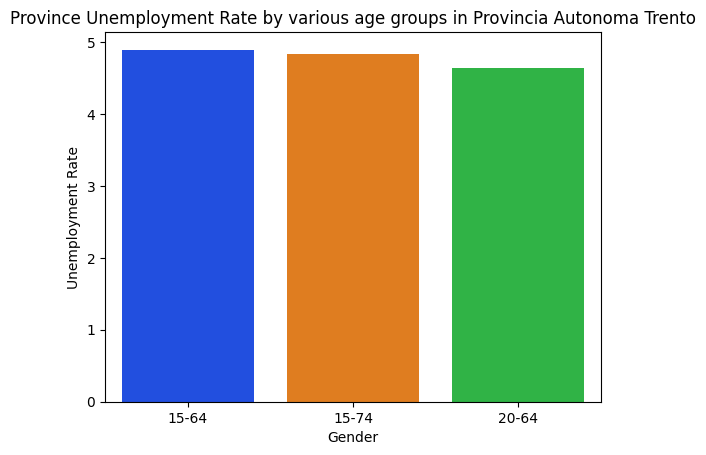

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


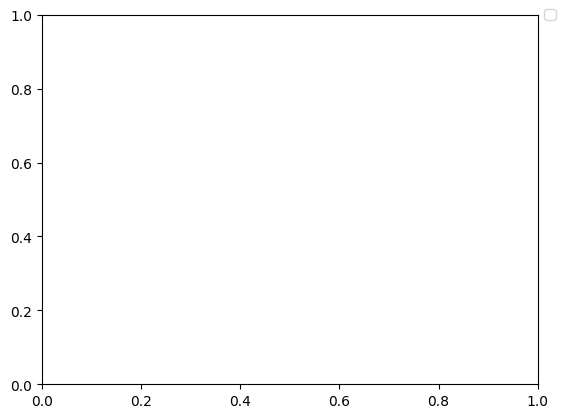

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


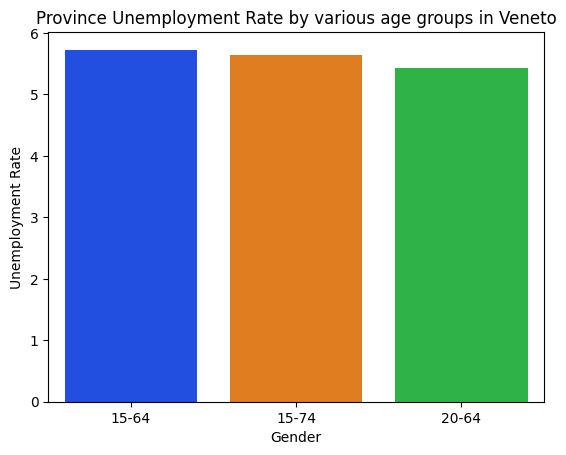

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


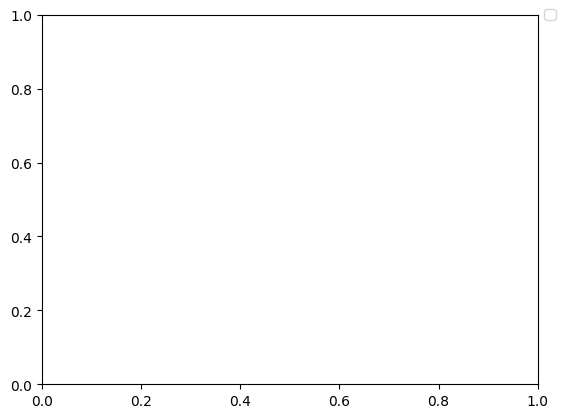

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


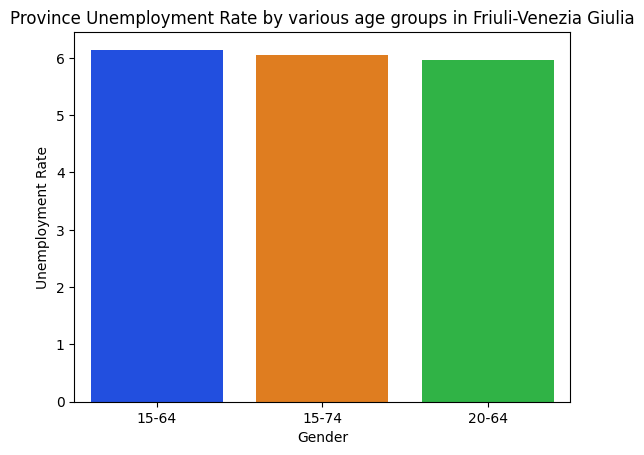

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


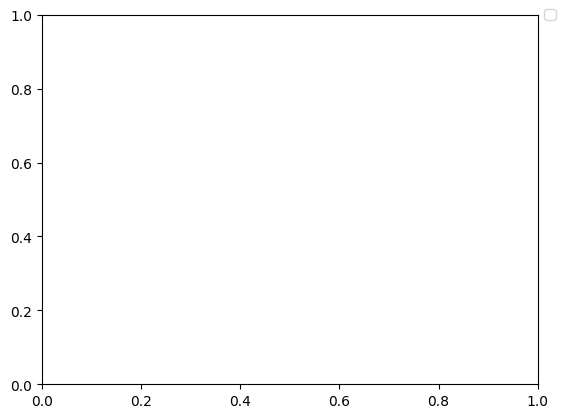

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


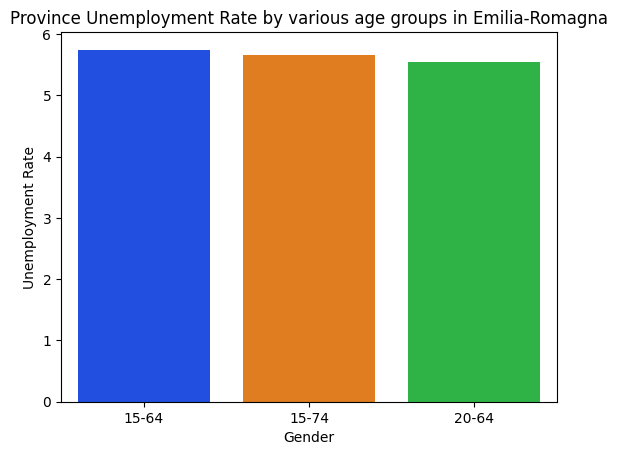

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


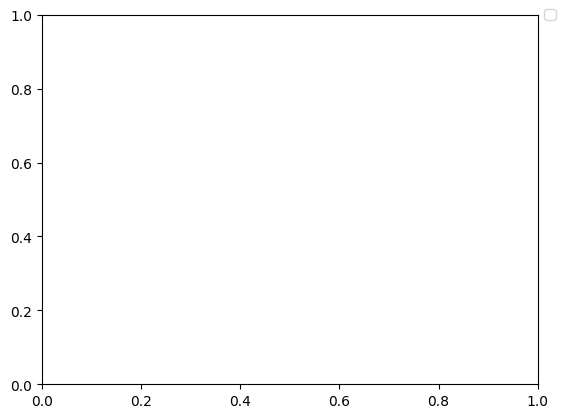

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


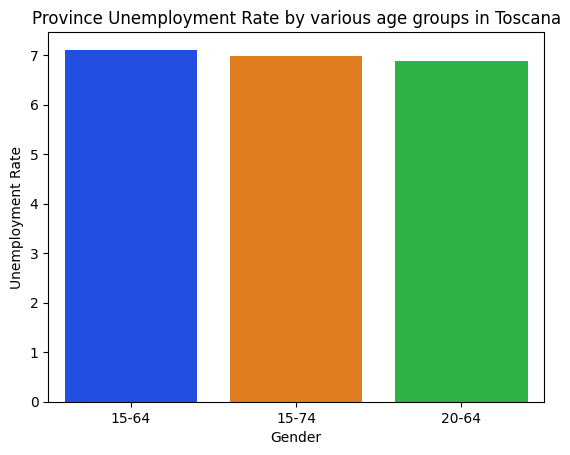

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


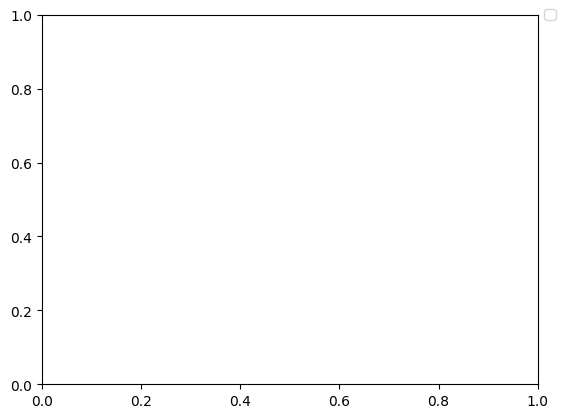

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


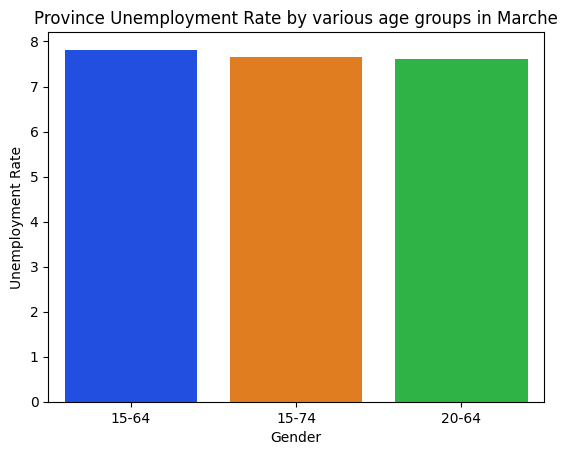

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


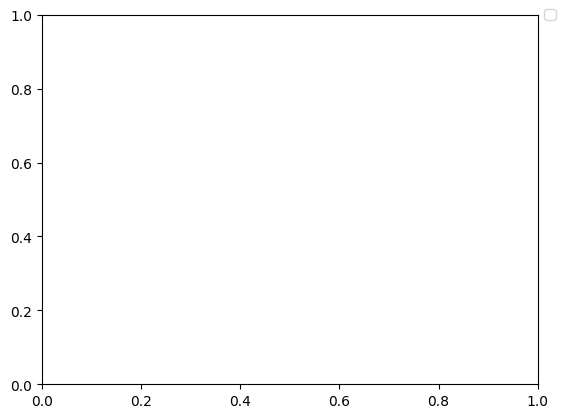

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


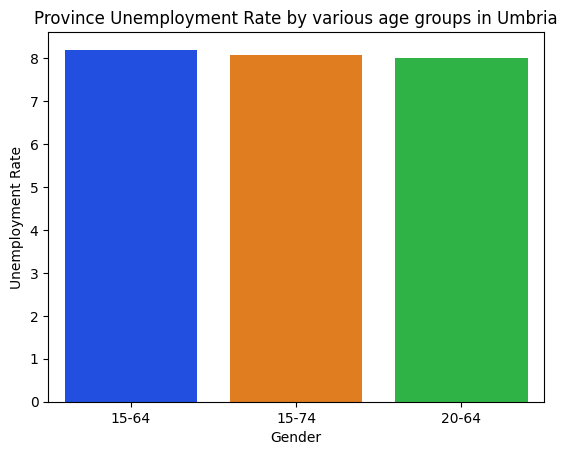

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


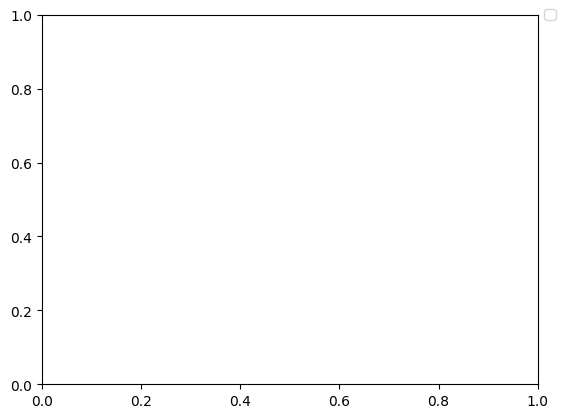

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


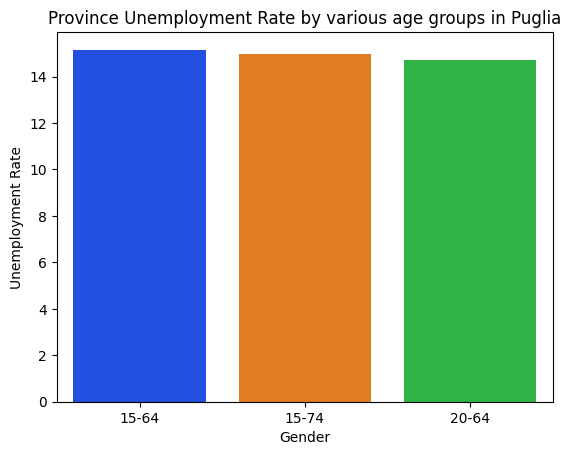

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


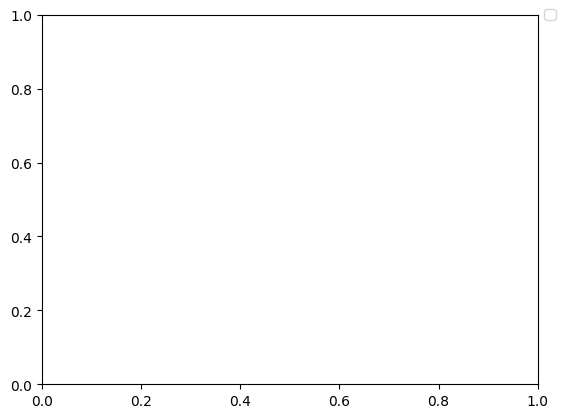

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


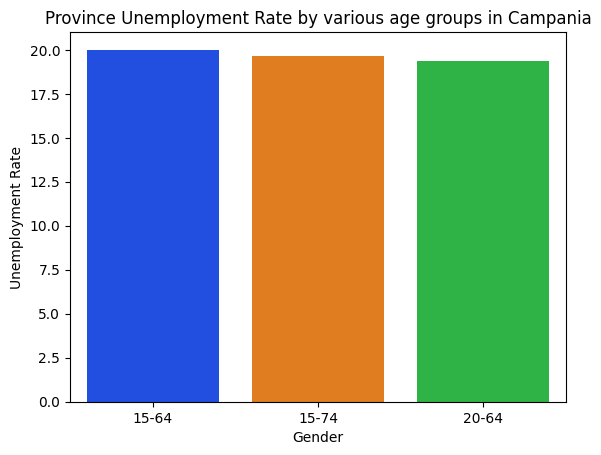

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


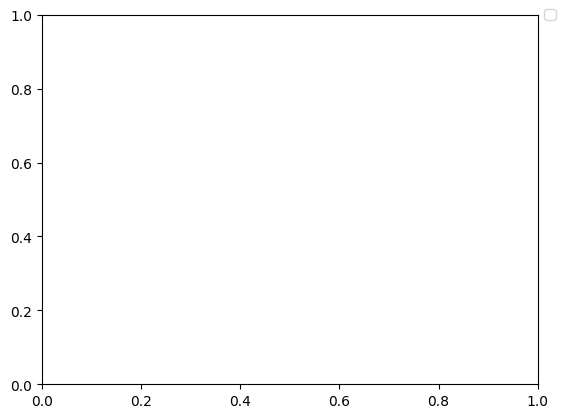

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


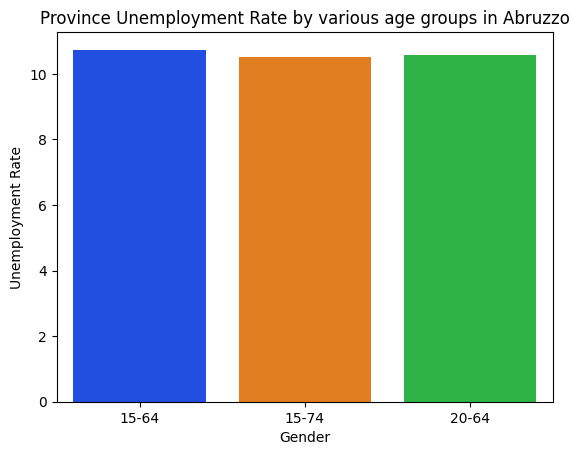

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


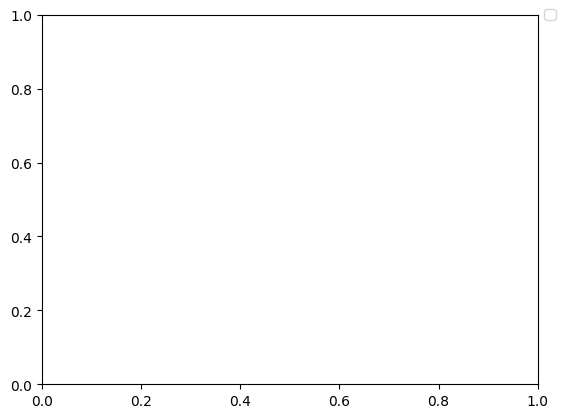

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


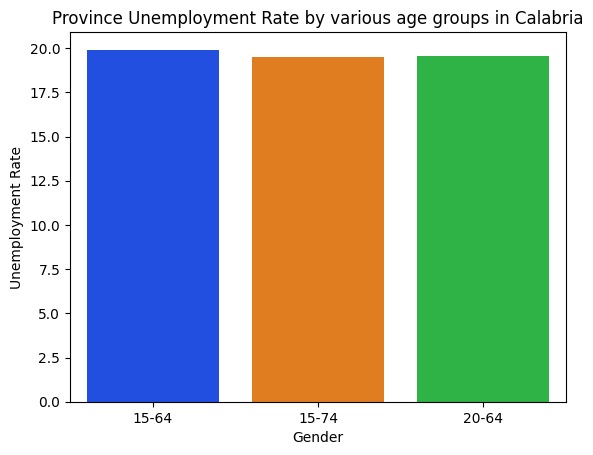

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


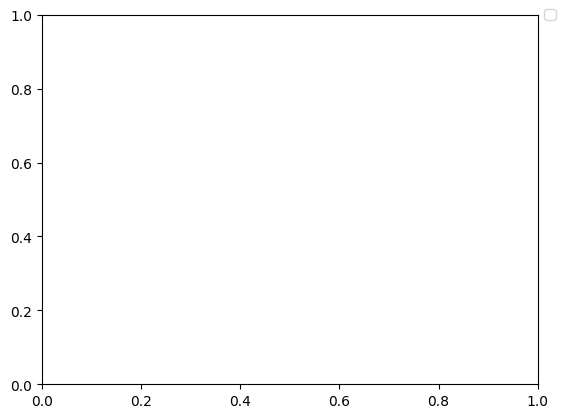

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


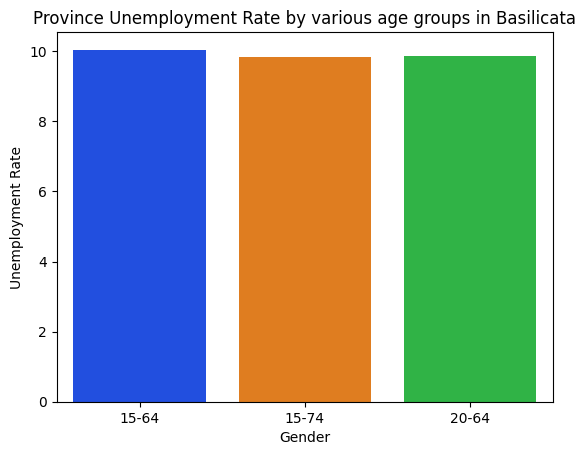

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


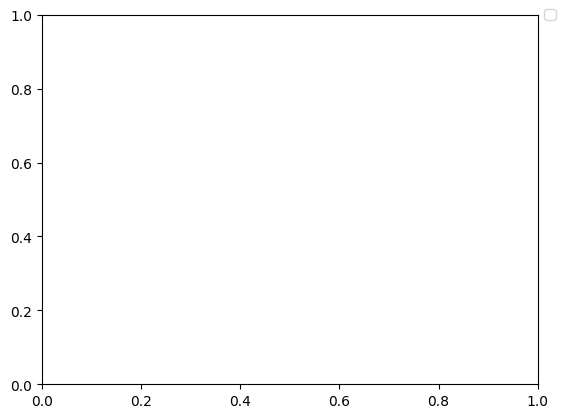

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


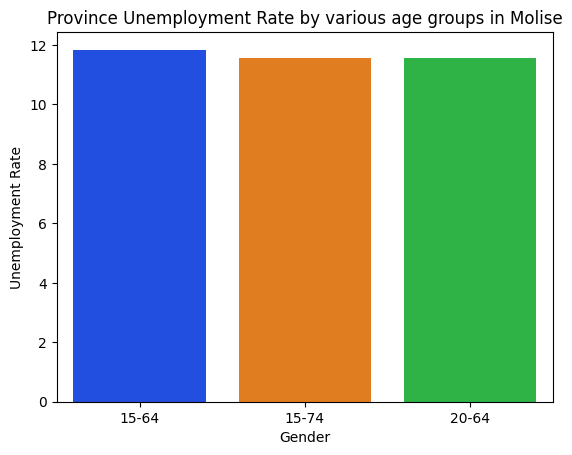

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


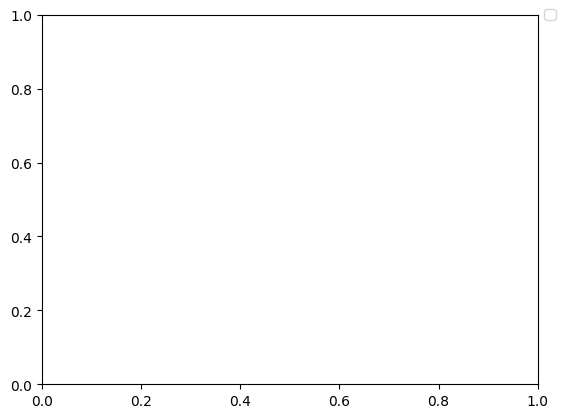

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


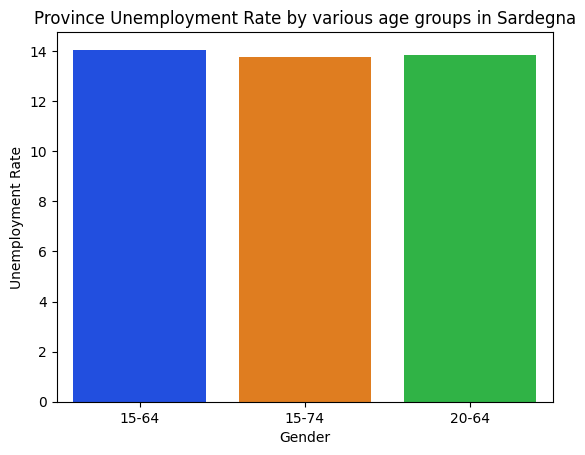

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


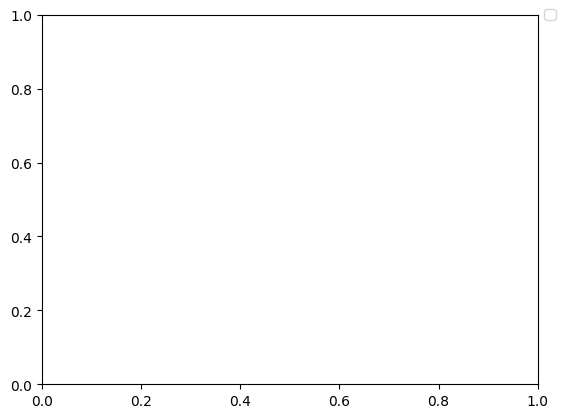

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


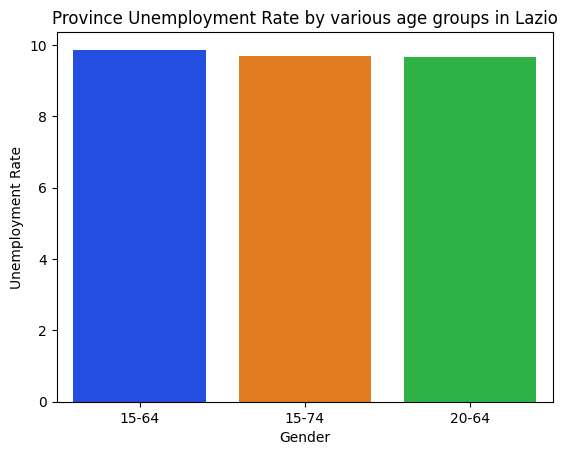

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


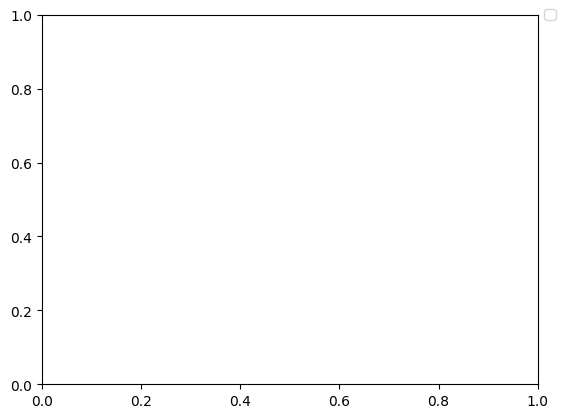

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\732304019.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')


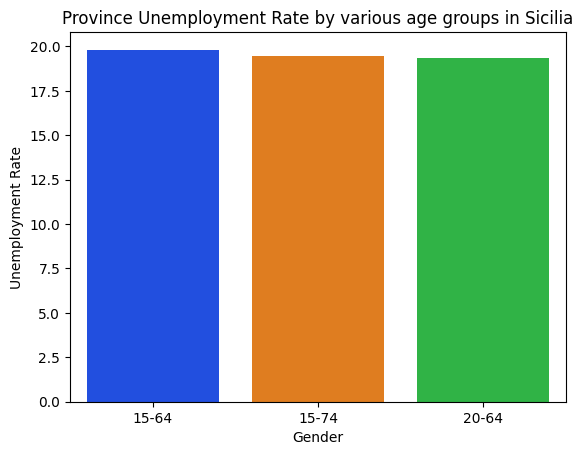

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


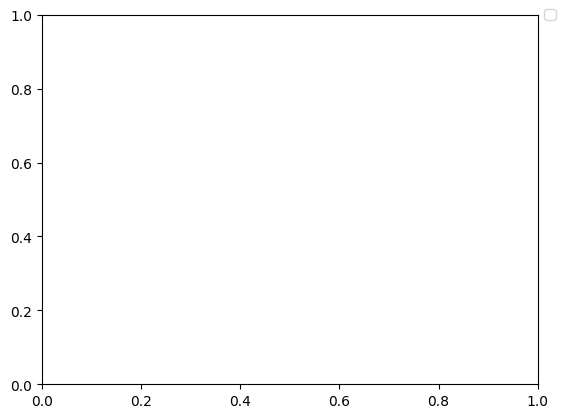

In [200]:
# Which age-groups generally has a higher seasonal unemployment rate overall in each province?

province_names = df['Province'].unique()

# Loop through each province and create the barplot
for province in province_names:
    # Filter the dataframe for the current province
    province_df = df[df['Province'] == province]
    
    # Create the barplot
    plt.figure()
    sns.barplot(y='ProvinceUNEM_R', x='age_range', data=province_df, ci=None, palette='bright')
    plt.title(f'Province Unemployment Rate by various age groups in {province}')
    plt.xlabel('Gender')
    plt.ylabel('Unemployment Rate')
    plt.show()
     # Move the legend to the right side of the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='right')
    
    plt.show()

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


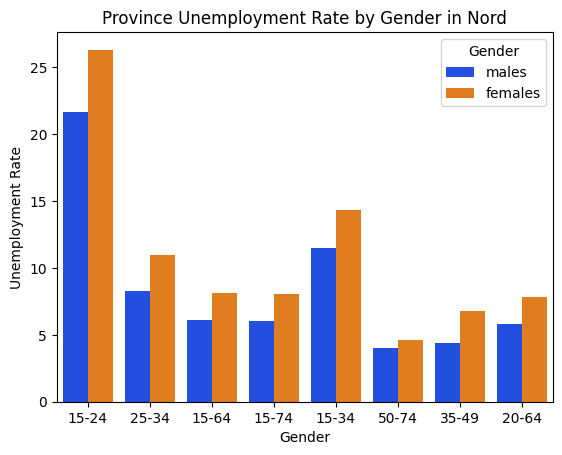

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


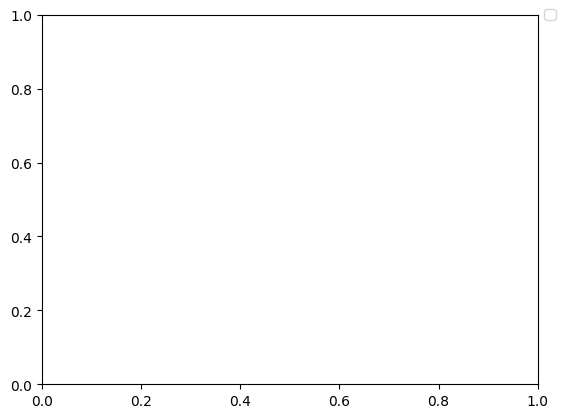

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


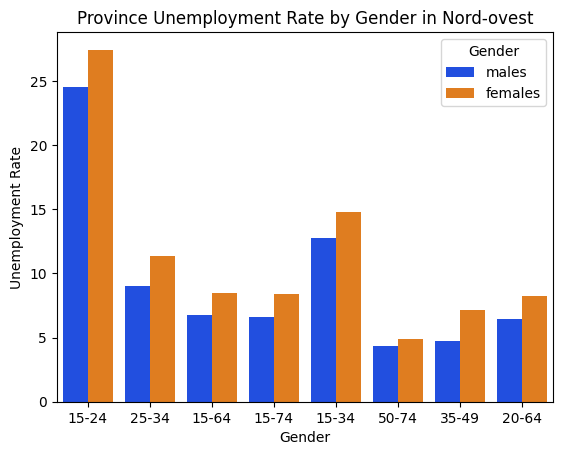

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


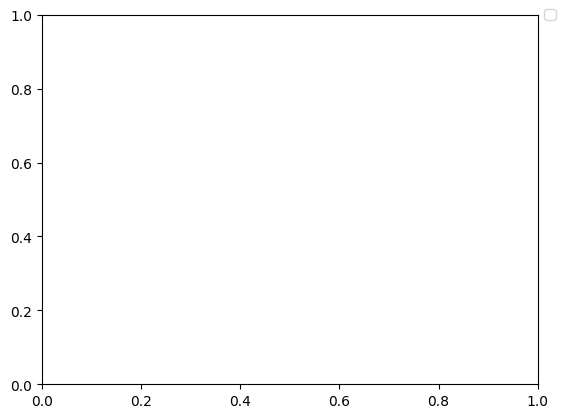

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


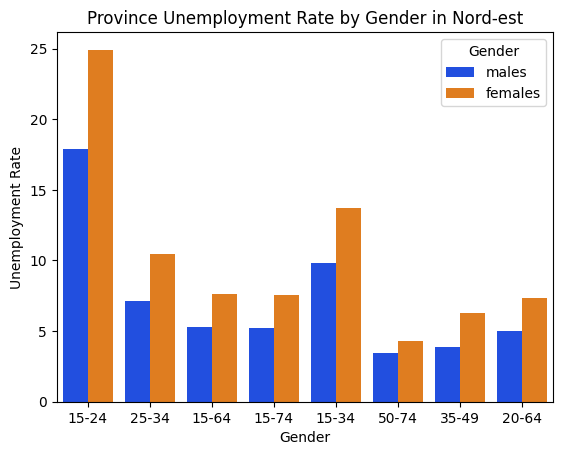

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


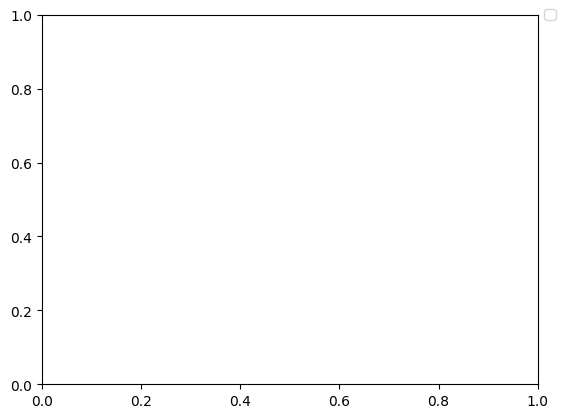

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


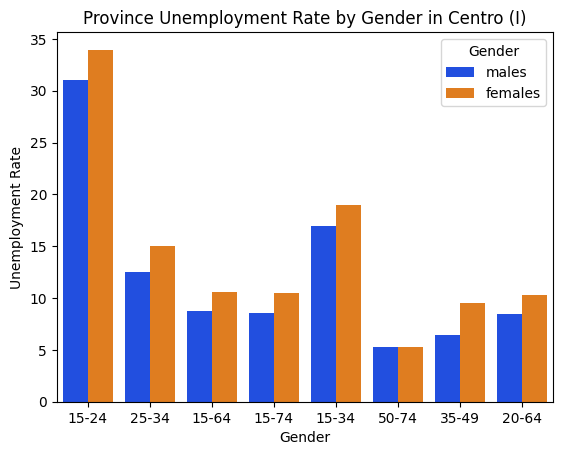

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


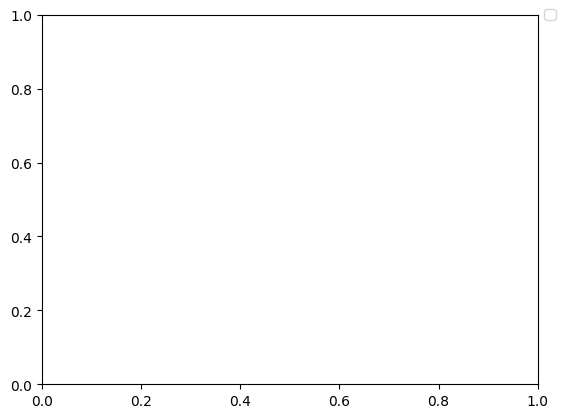

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


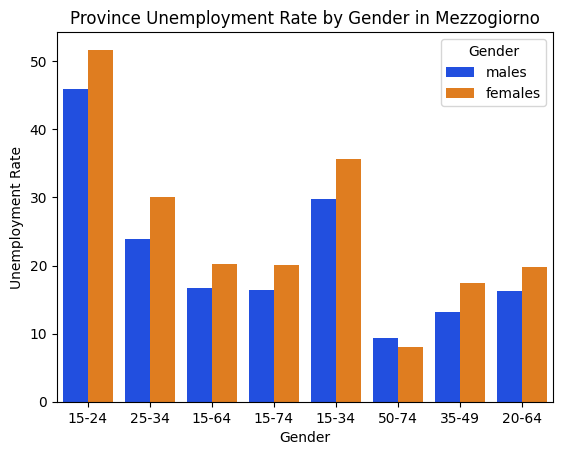

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


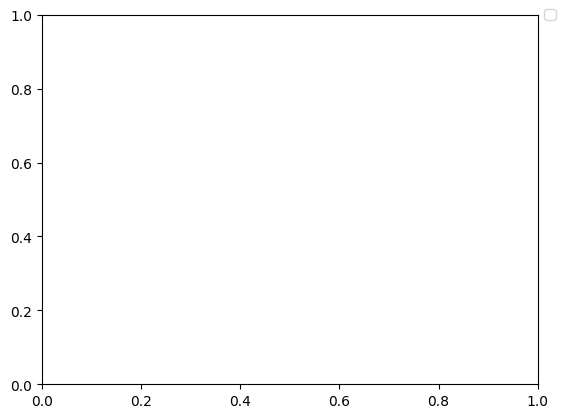

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


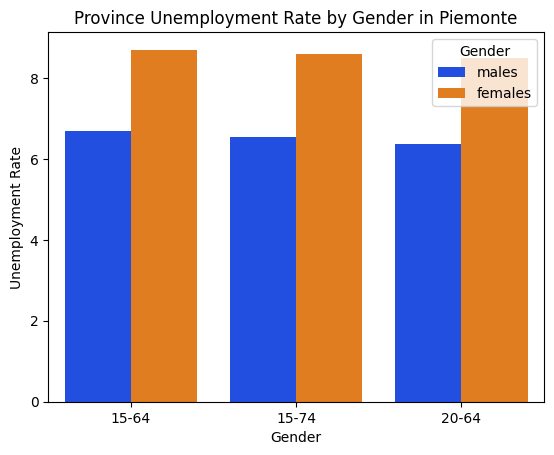

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


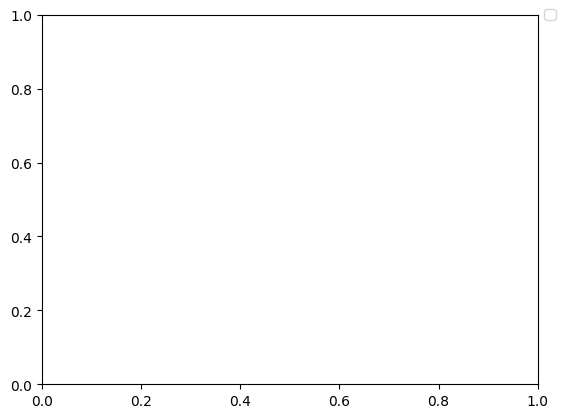

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


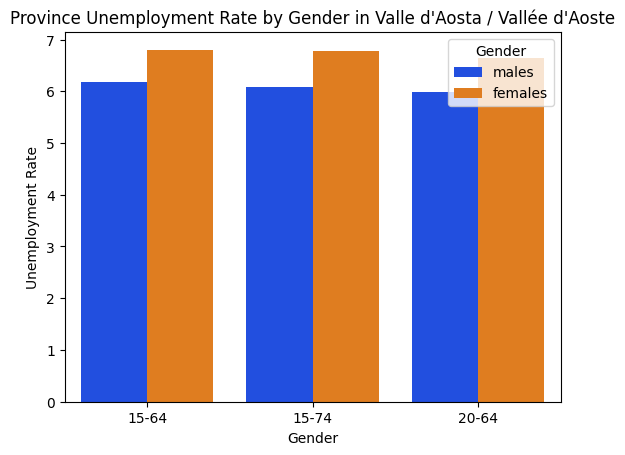

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


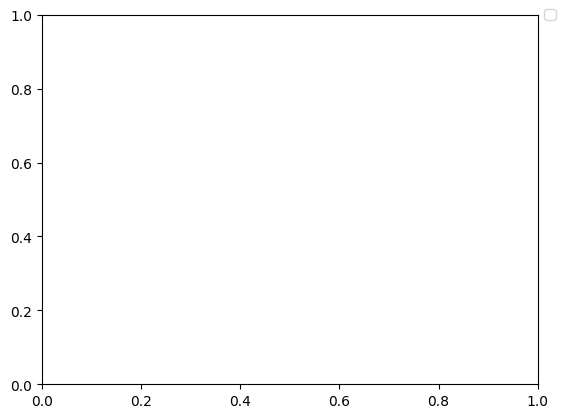

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


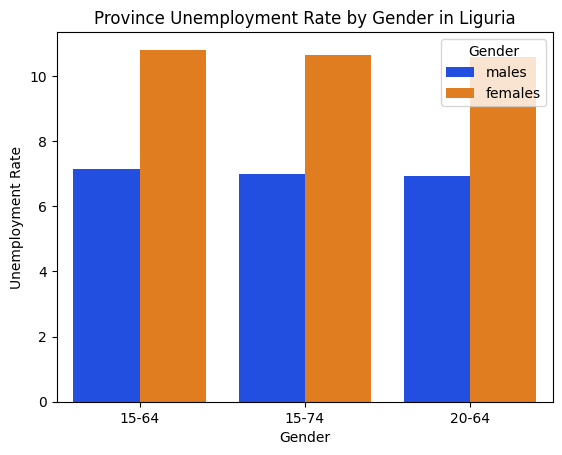

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


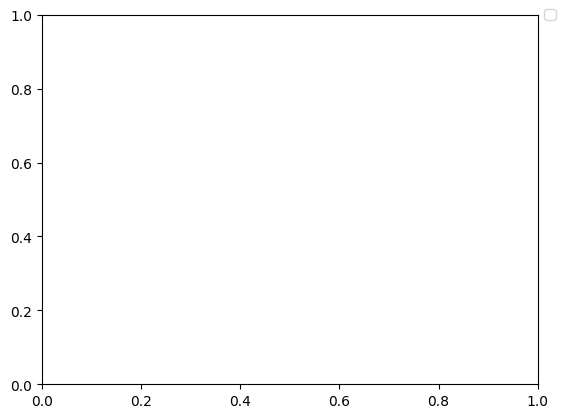

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


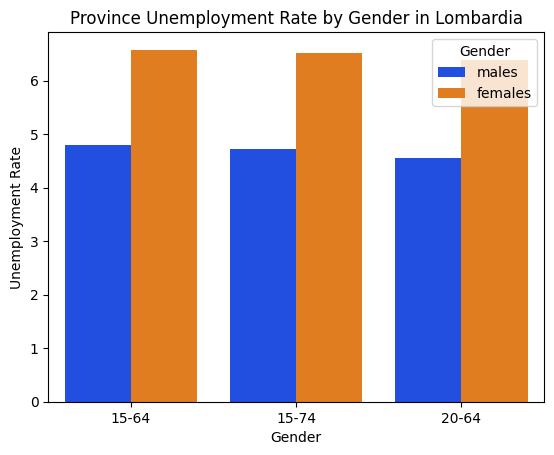

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


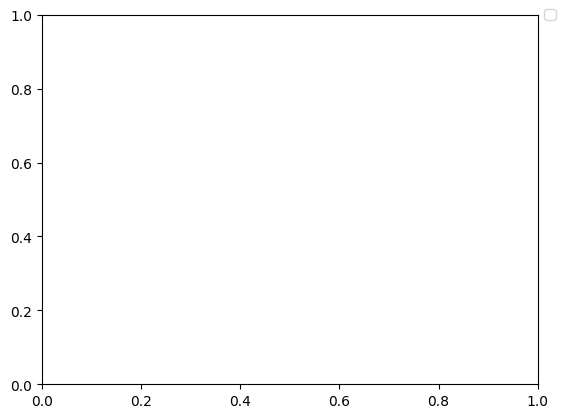

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


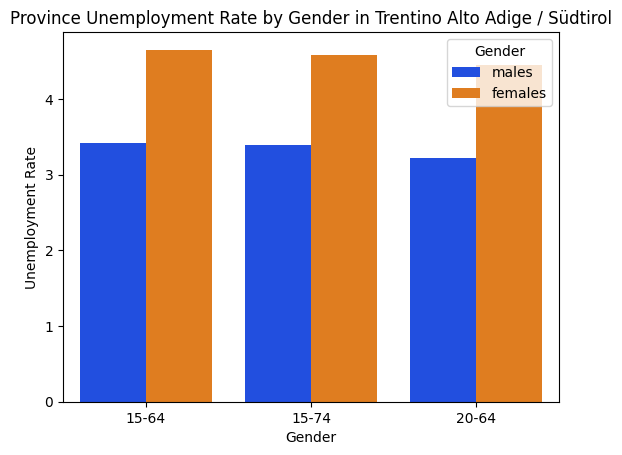

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


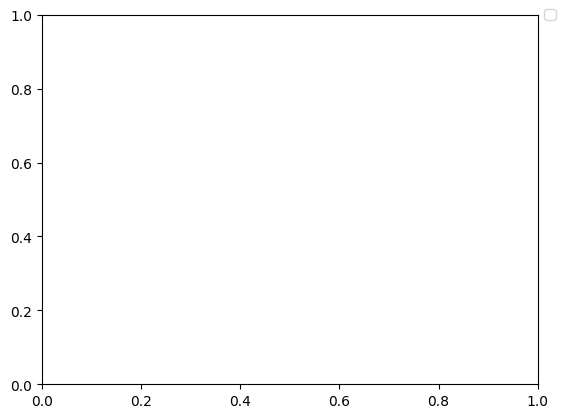

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


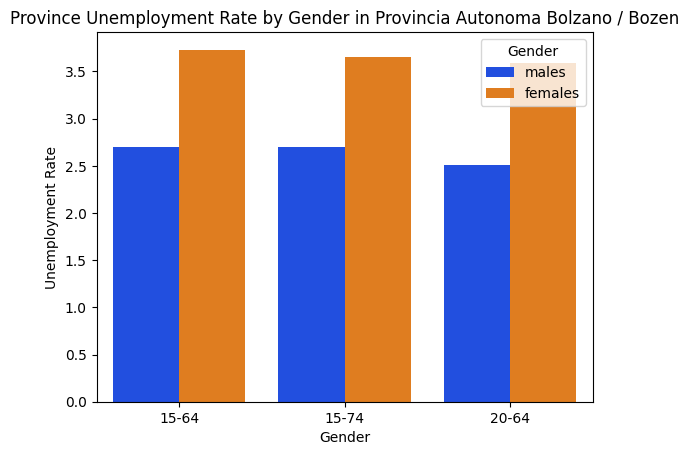

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


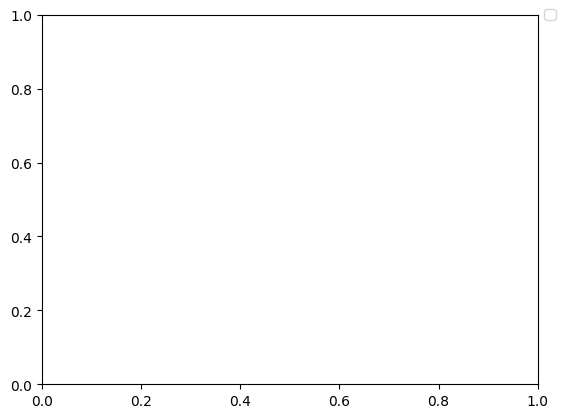

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


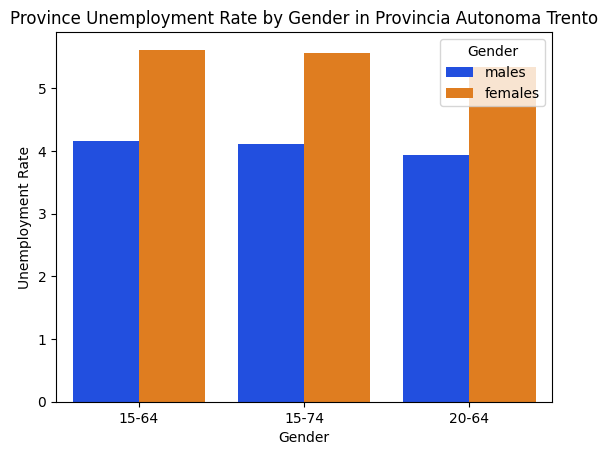

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


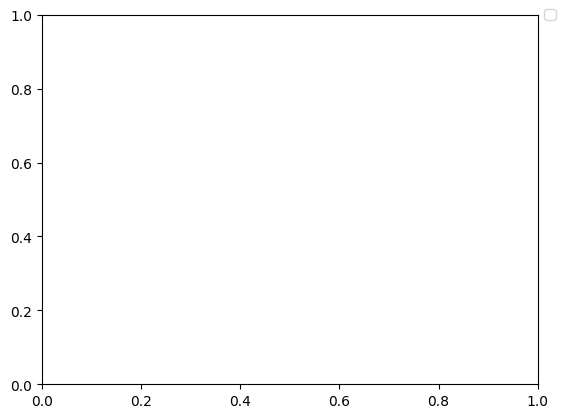

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


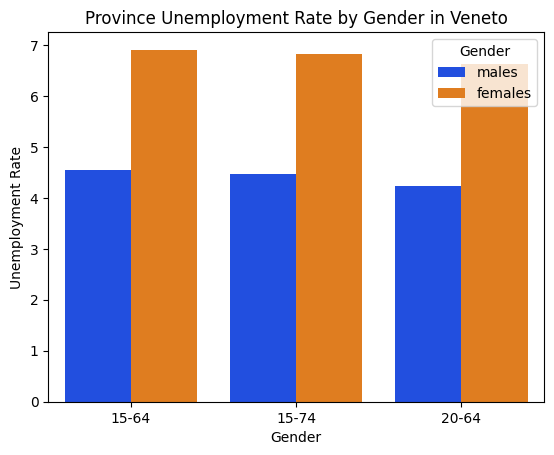

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


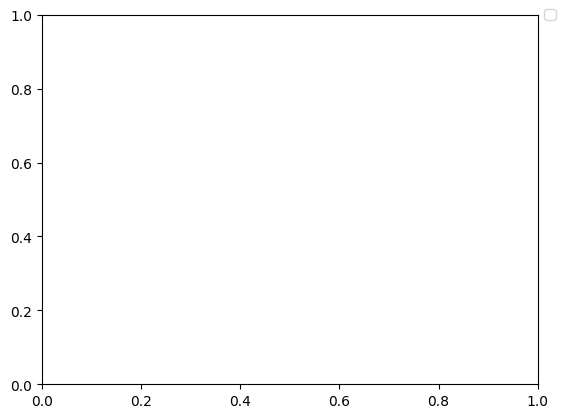

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


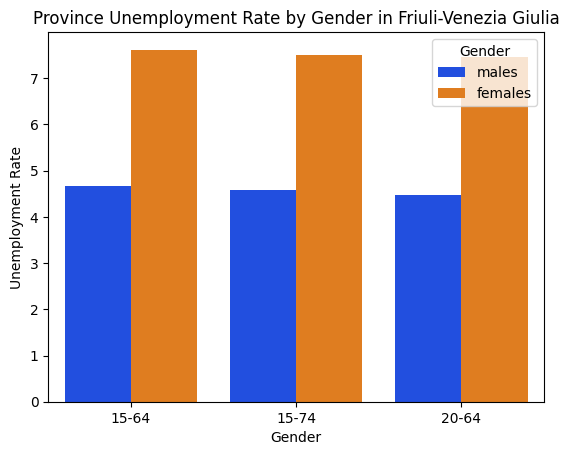

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


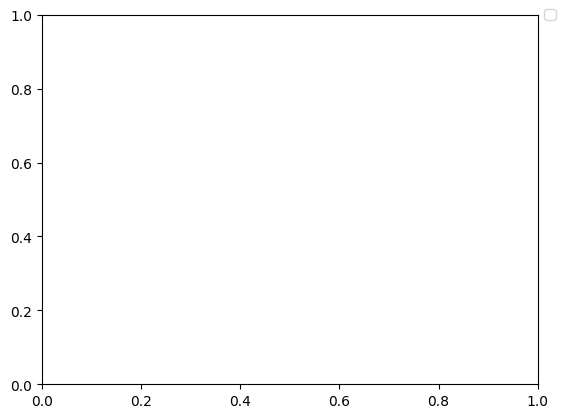

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


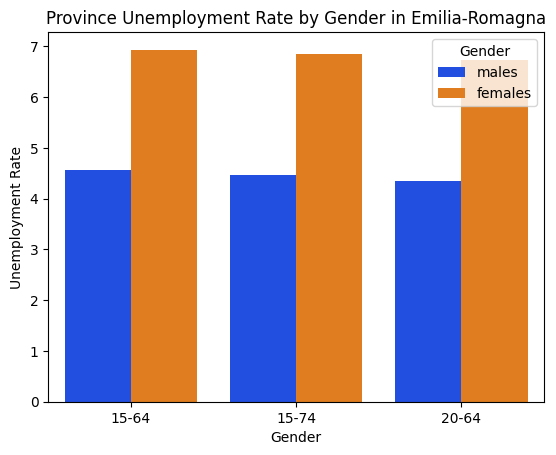

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


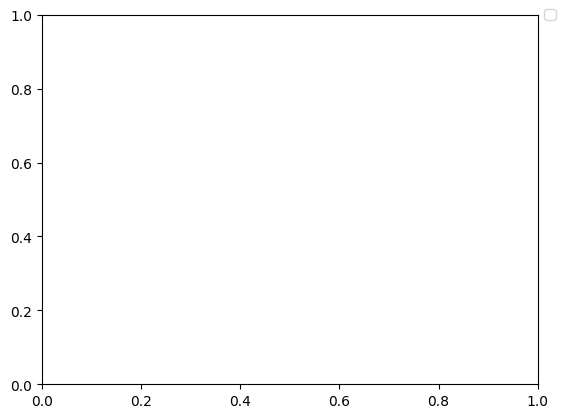

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


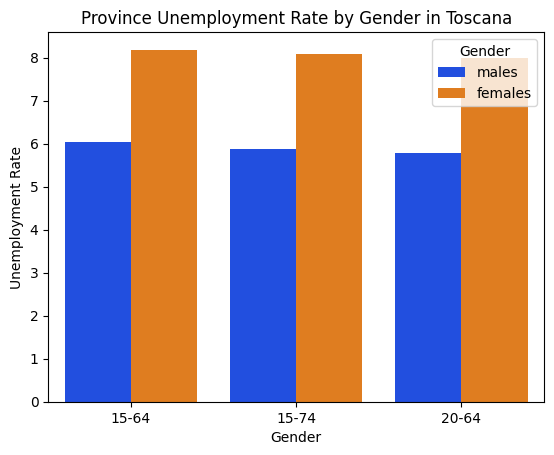

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


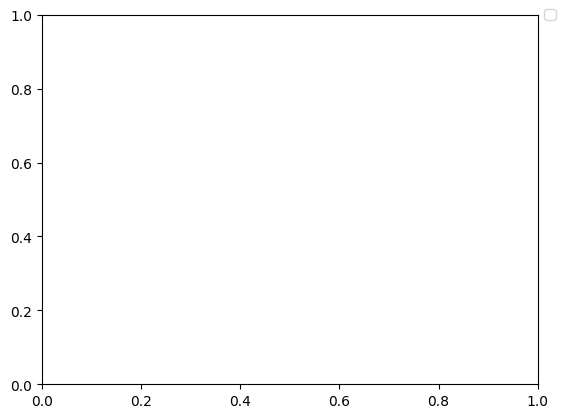

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


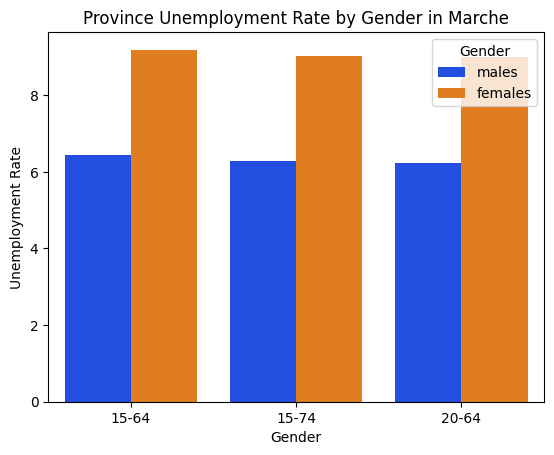

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


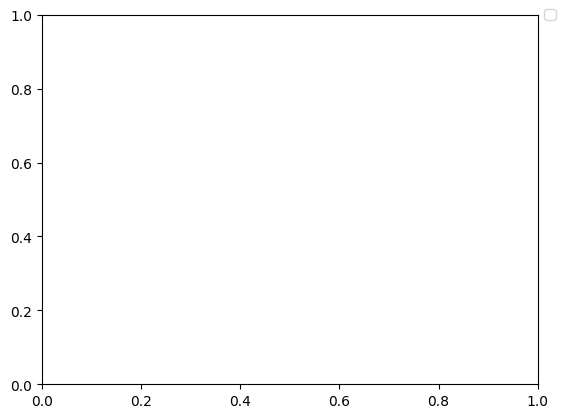

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


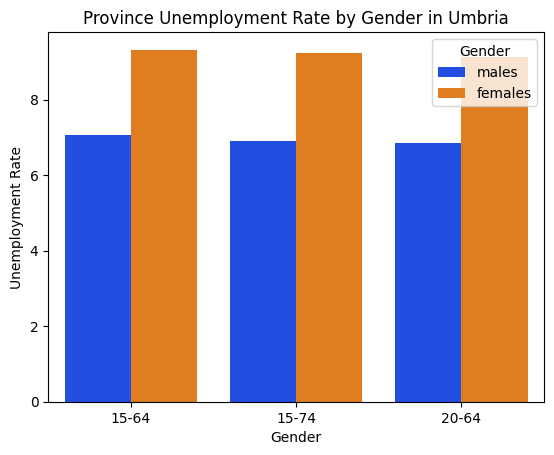

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


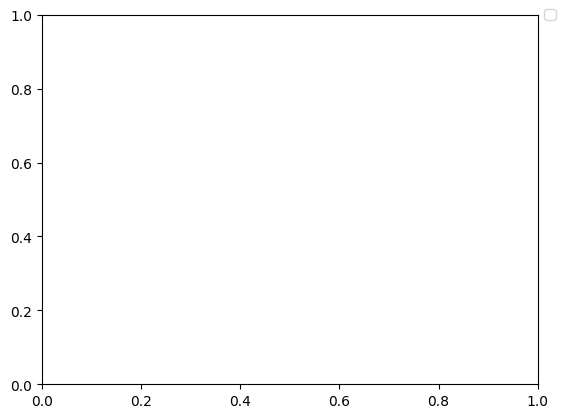

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


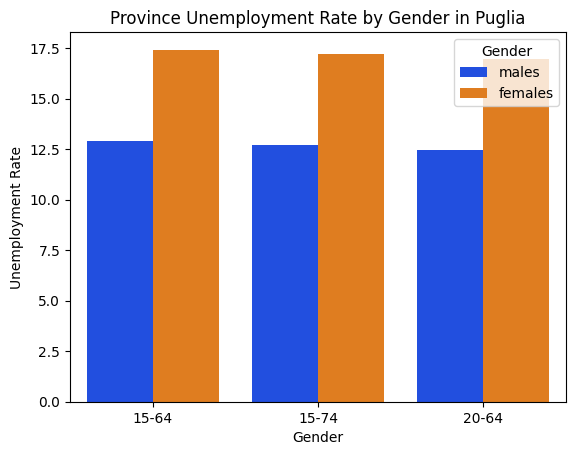

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


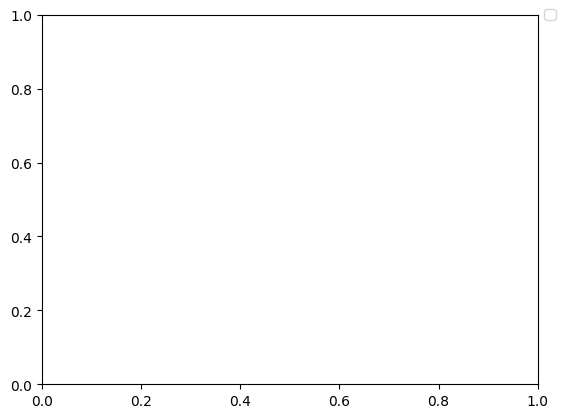

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


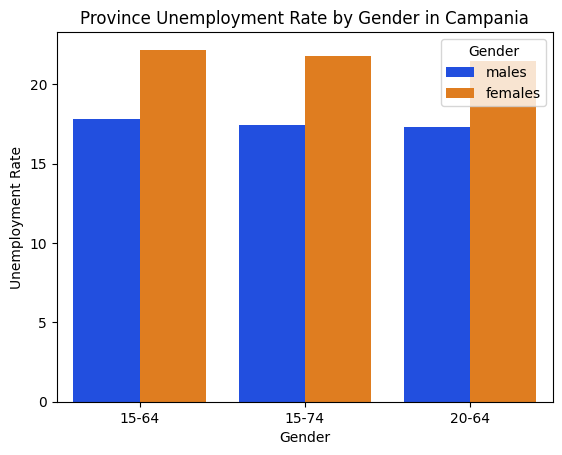

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


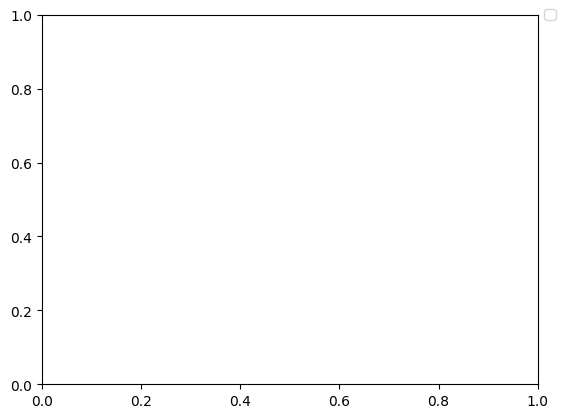

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


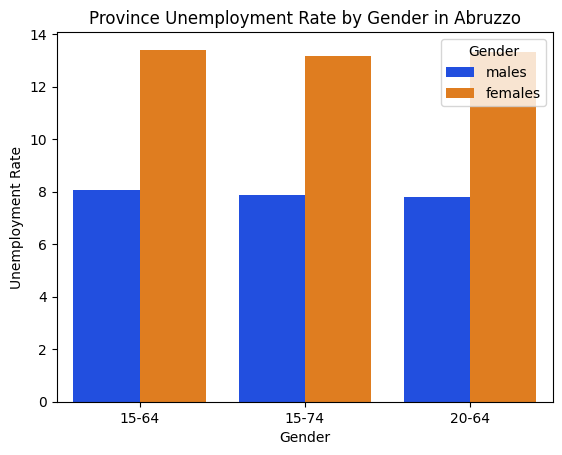

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


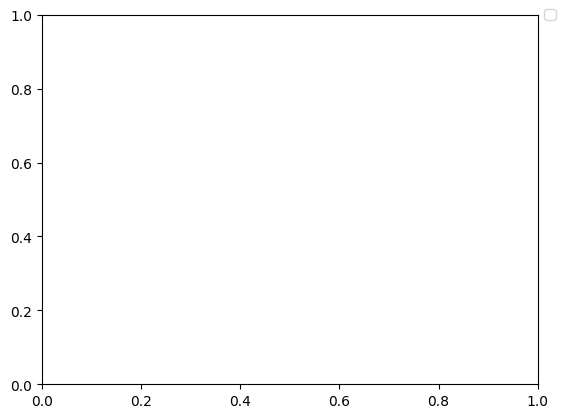

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


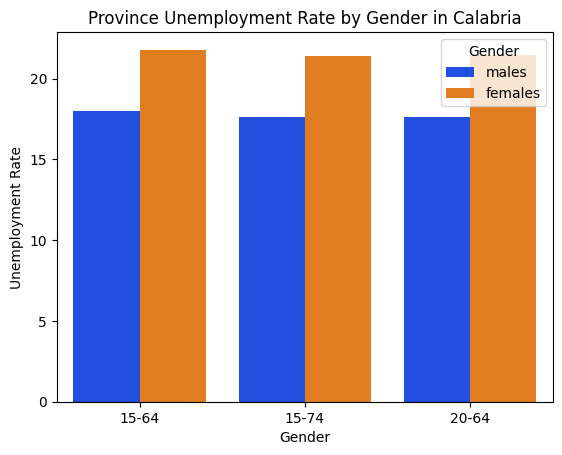

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


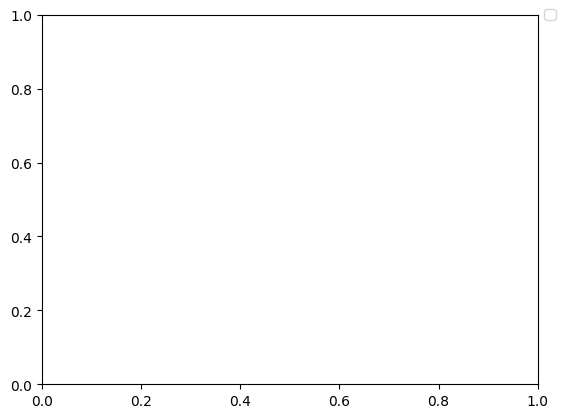

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


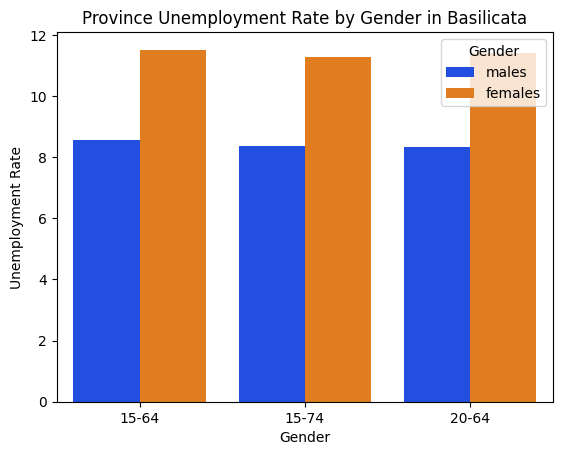

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


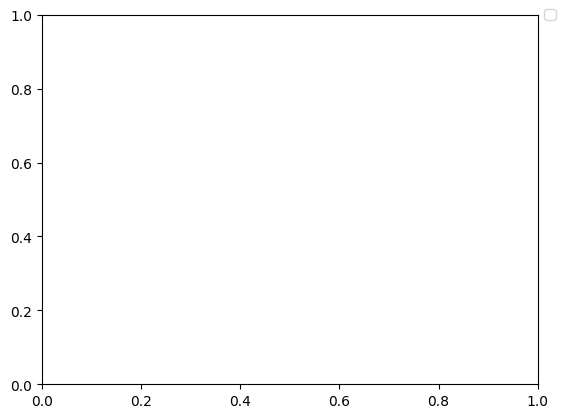

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


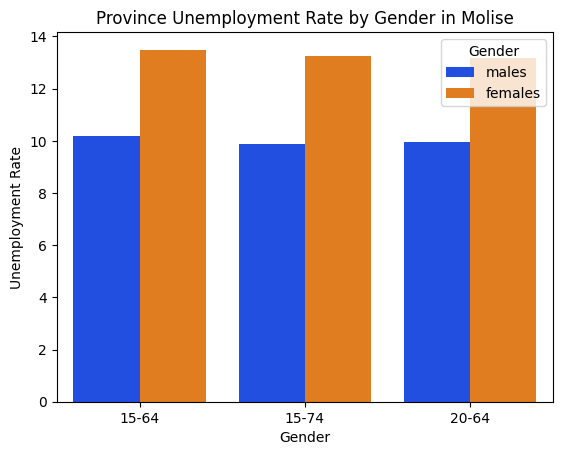

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


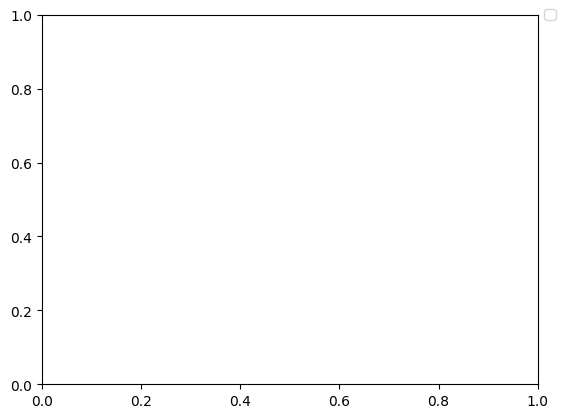

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


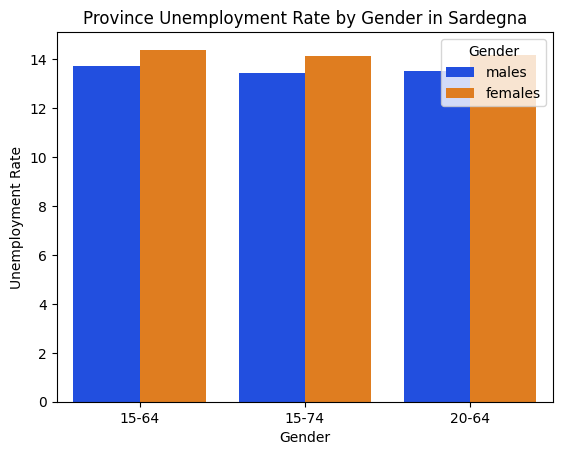

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


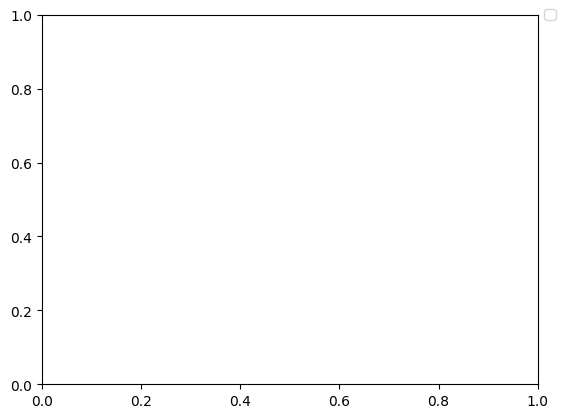

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


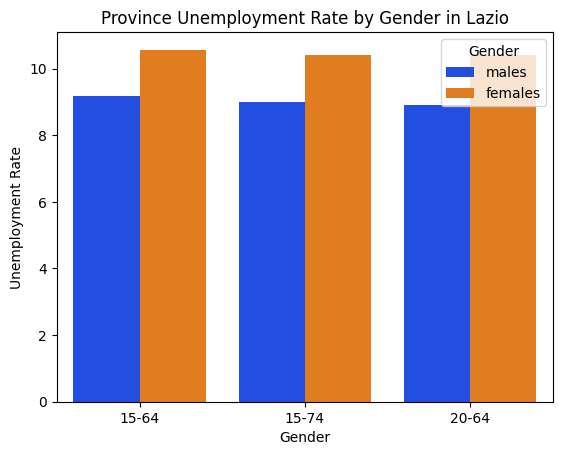

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


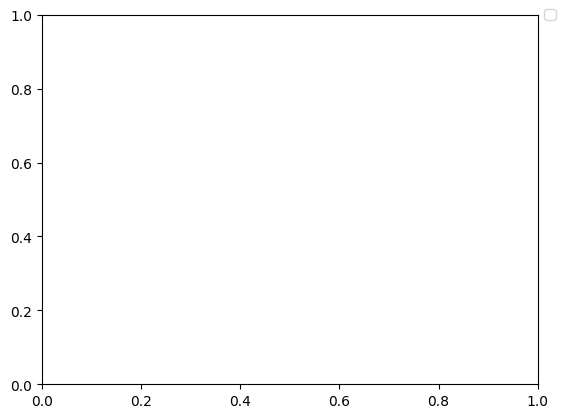

C:\Users\chimi\AppData\Local\Temp\ipykernel_19884\1594526477.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')


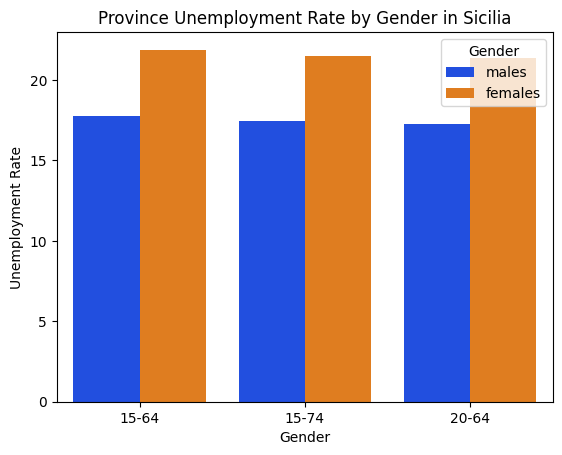

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


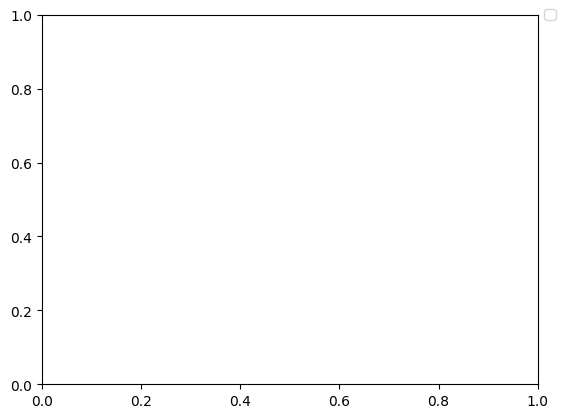

In [201]:
# How does unemployment vary across different age ranges for each province, separated by gender?
province_names = df['Province'].unique()

# Loop through each province and create the barplot
for province in province_names:
    # Filter the dataframe for the current province
    province_df = df[df['Province'] == province]
    
    # Create the barplot
    plt.figure()
    sns.barplot(y='ProvinceUNEM_R', x='age_range', hue='Gender', data=province_df, ci=None, palette='bright')
    plt.title(f'Province Unemployment Rate by Gender in {province}')
    plt.xlabel('Gender')
    plt.ylabel('Unemployment Rate')
    plt.show()
     # Move the legend to the right side of the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='center right')
    
    plt.show()

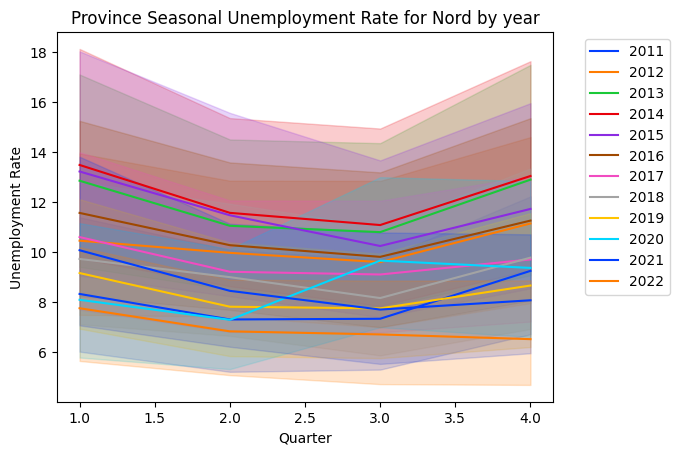

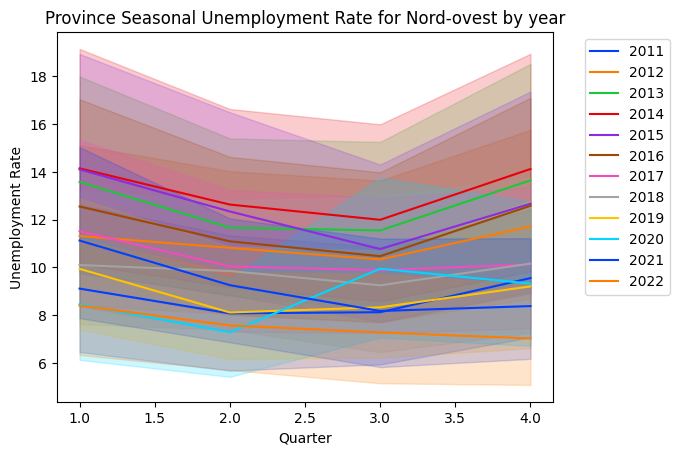

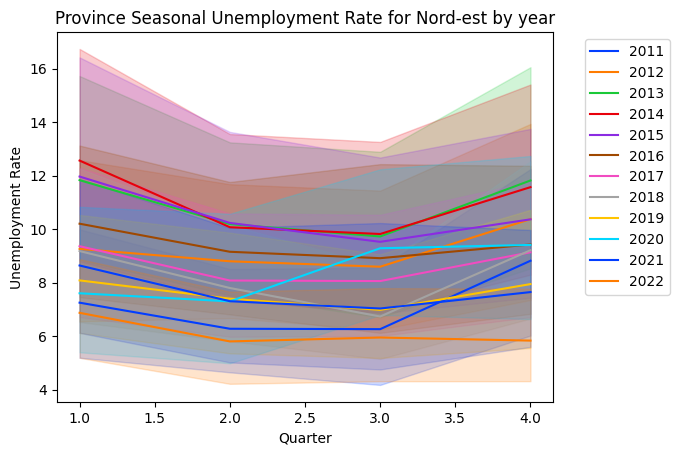

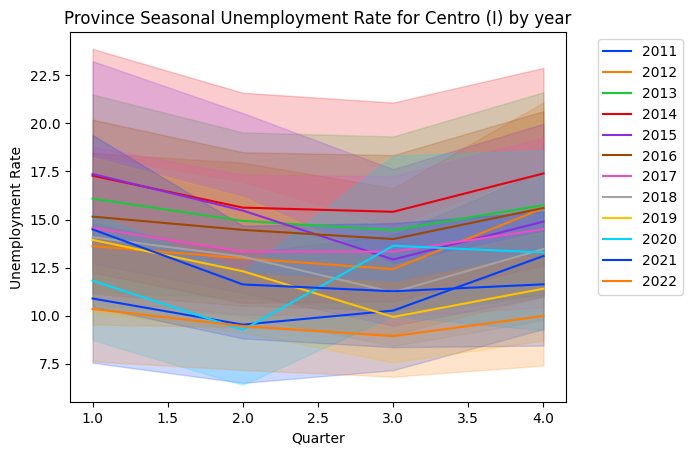

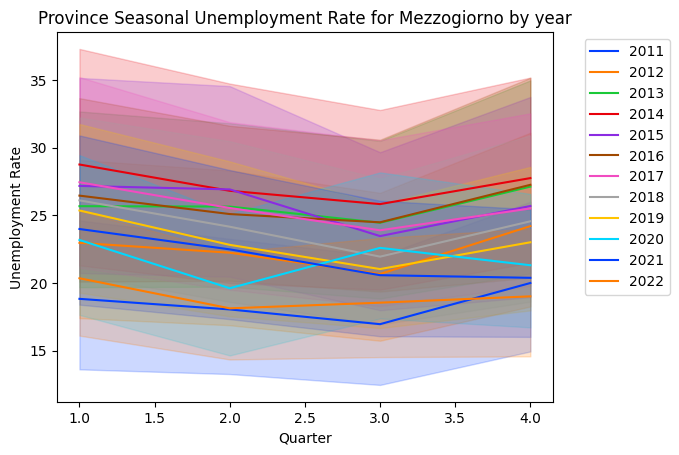

...

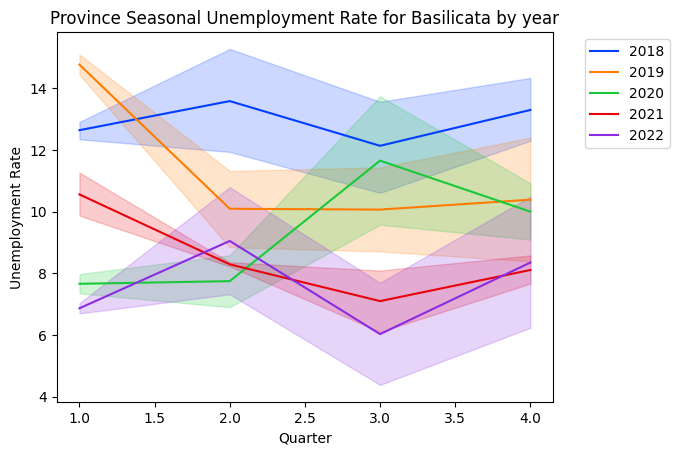

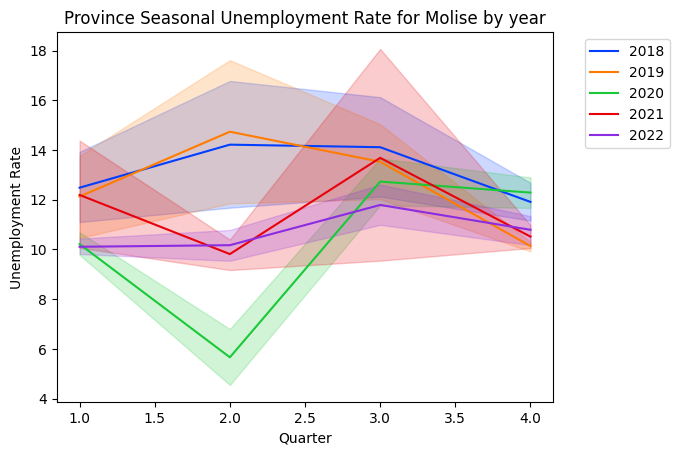

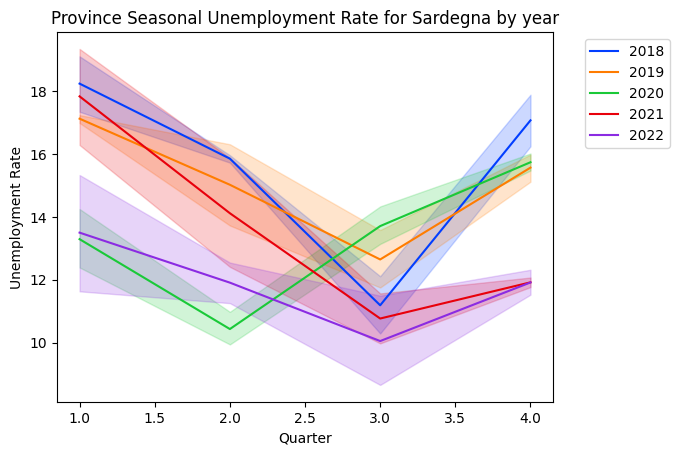

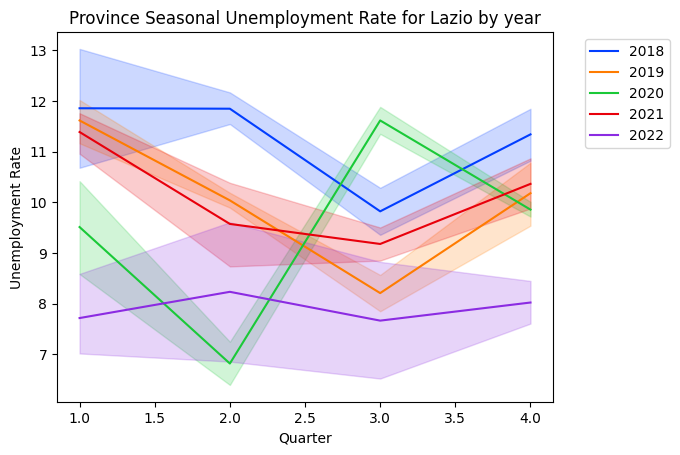

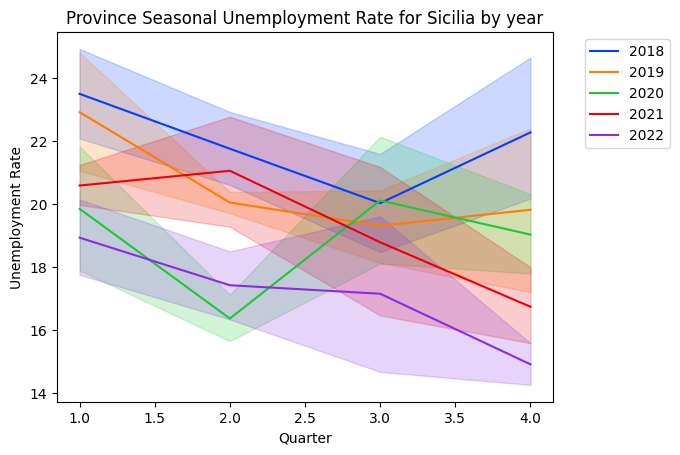

In [203]:
# What is the seasonal unemployment trend year-wise for each Province?

# Get unique provinces from the 'Province' column
provinces = df['Province'].unique()

# Loop through each province and create a line plot
for province in provinces:
    # Filter the dataframe for the current province
    province_df = df[df['Province'] == province]
    
    # Create the line plot
    plt.figure()
    sns.lineplot(x='Quarter', y='ProvinceUNEM_R', hue='Year', data=province_df, palette='bright')
    plt.title(f'Province Seasonal Unemployment Rate for {province} by year')
    plt.xlabel('Quarter')
    plt.ylabel('Unemployment Rate')
    # Move the legend to the right side of the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

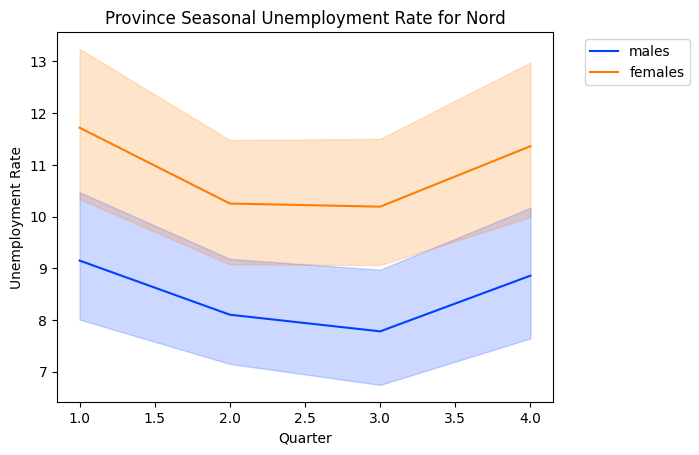

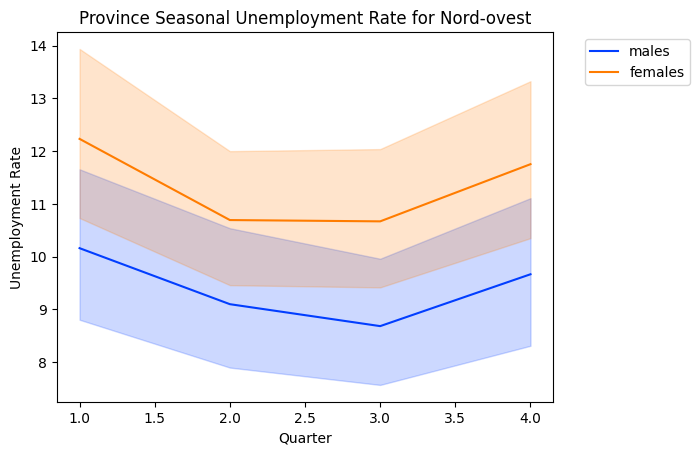

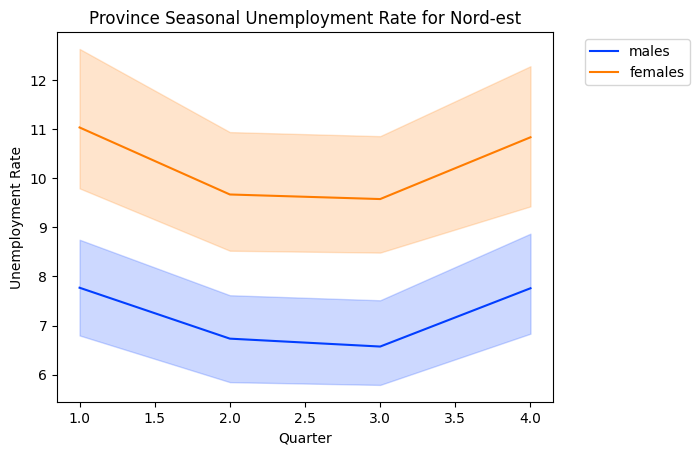

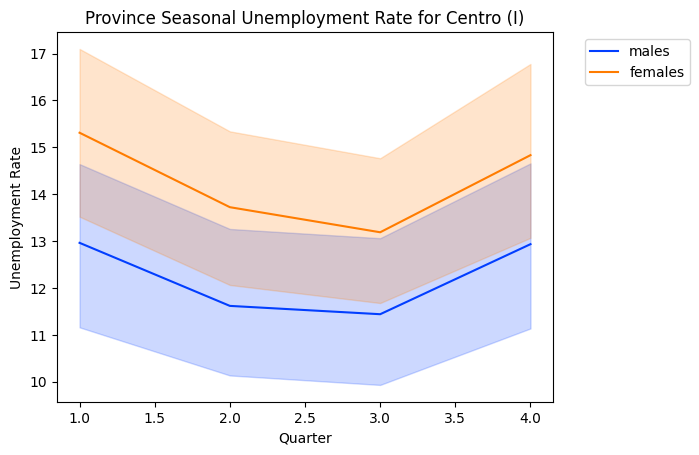

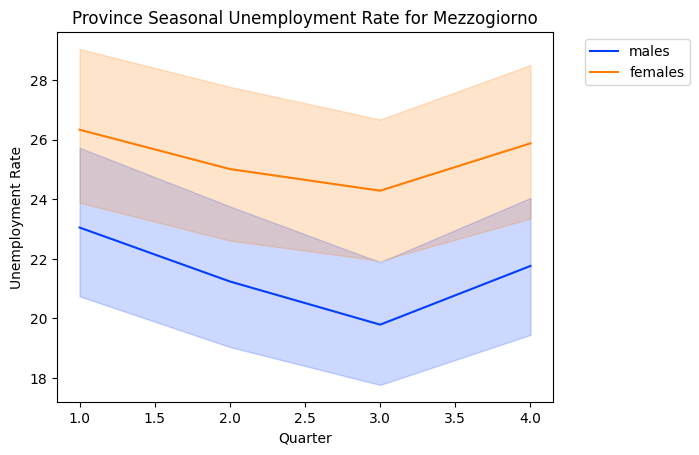

...

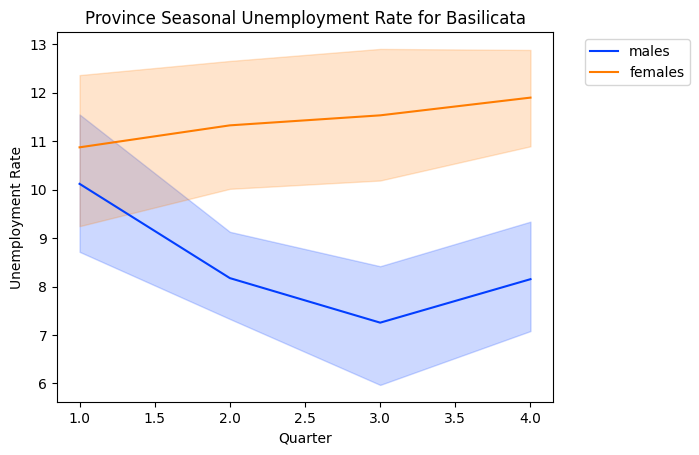

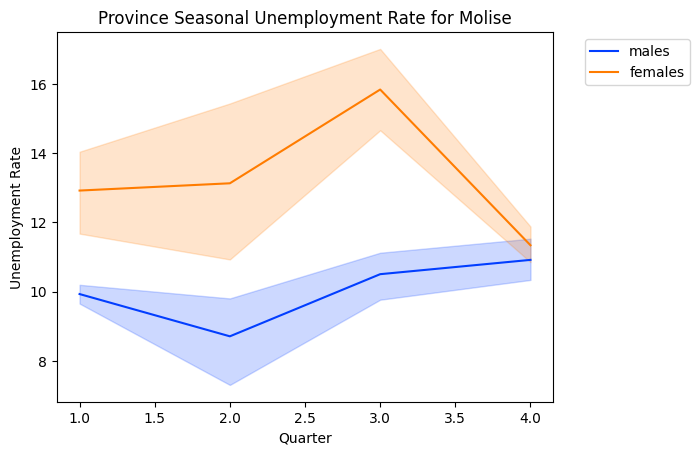

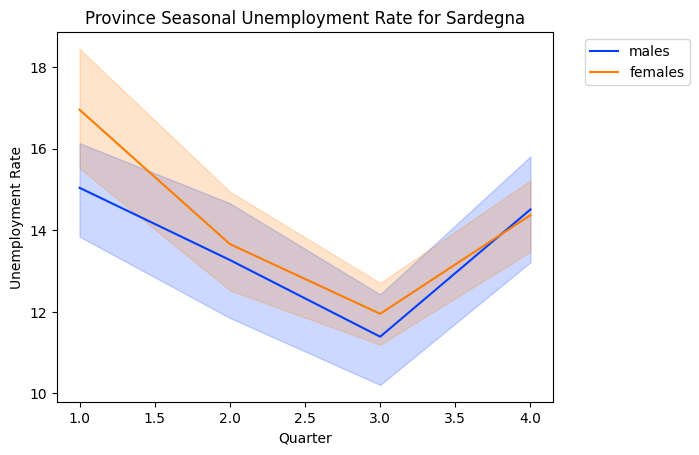

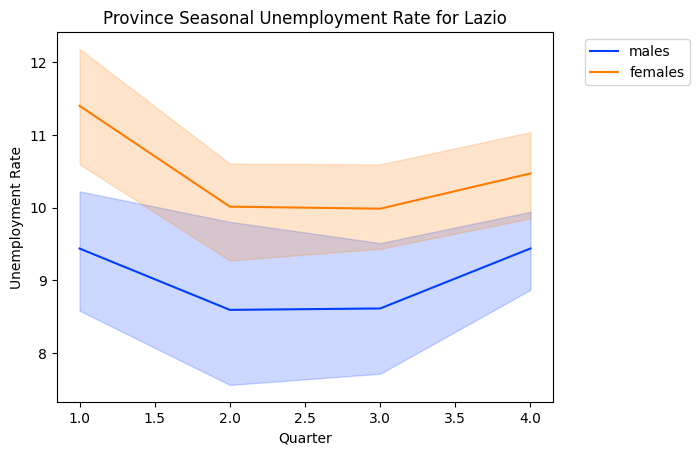

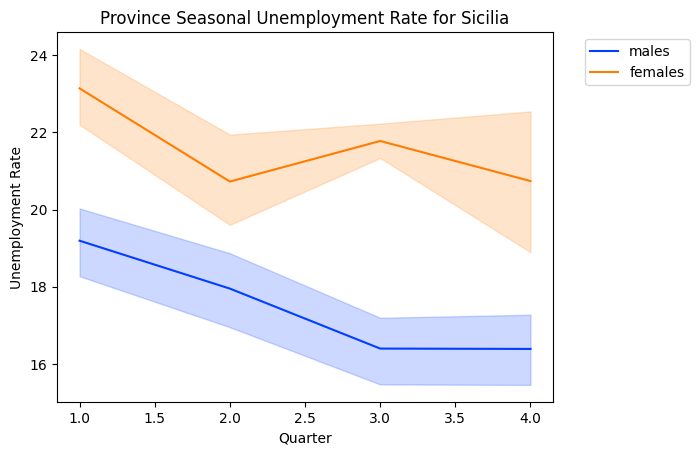

In [205]:
# What is the seasonal unemployment trend for each Province, broken down Gender?
provinces = df['Province'].unique()

# Loop through each province and create a line plot
for province in provinces:
    # Filter the dataframe for the current province
    province_df = df[df['Province'] == province]
    
    # Create the line plot
    plt.figure()
    sns.lineplot(x='Quarter', y='ProvinceUNEM_R', hue='Gender', data=province_df, palette='bright')
    plt.title(f'Province Seasonal Unemployment Rate for {province}')
    plt.xlabel('Quarter')
    plt.ylabel('Unemployment Rate')
    # Move the legend to the right side of the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

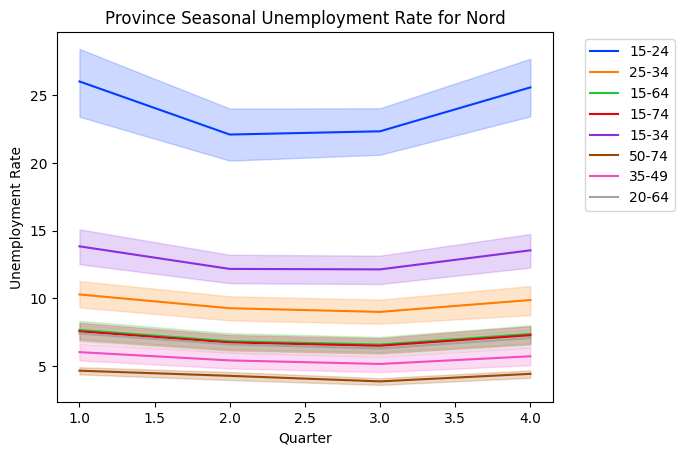

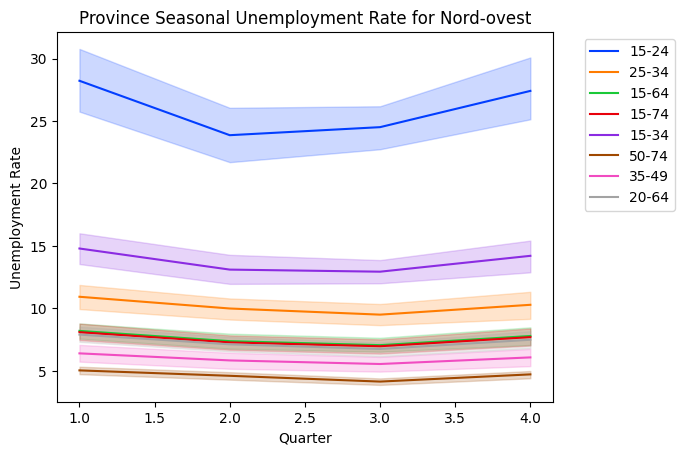

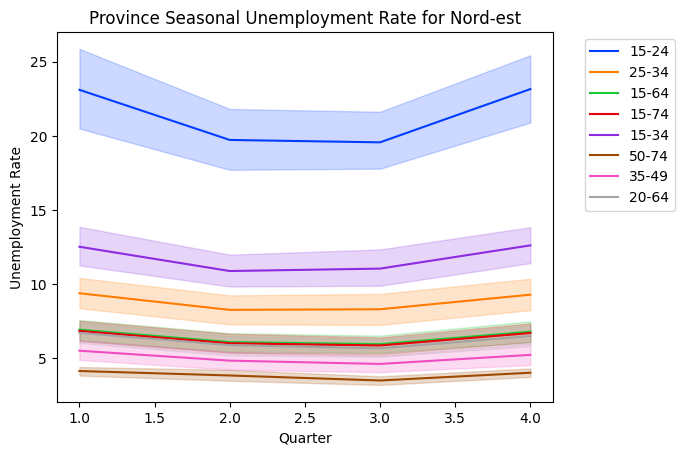

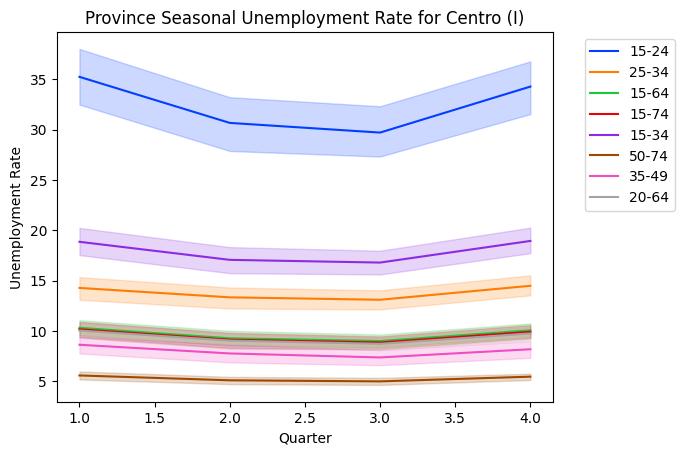

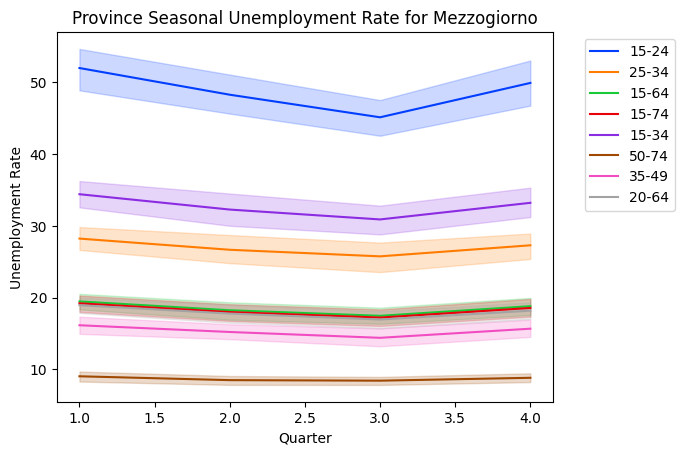

...

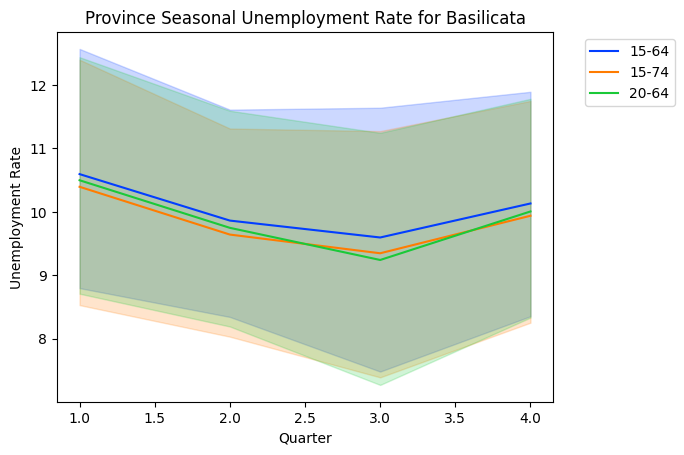

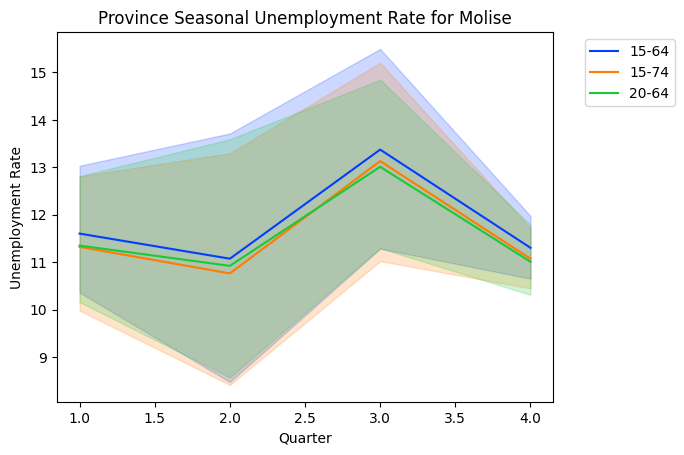

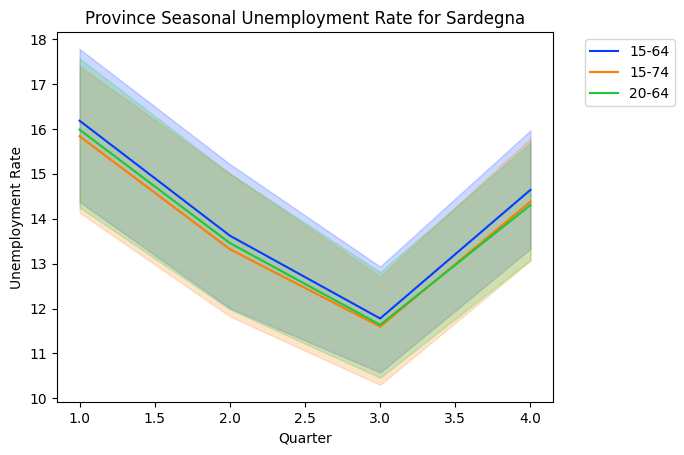

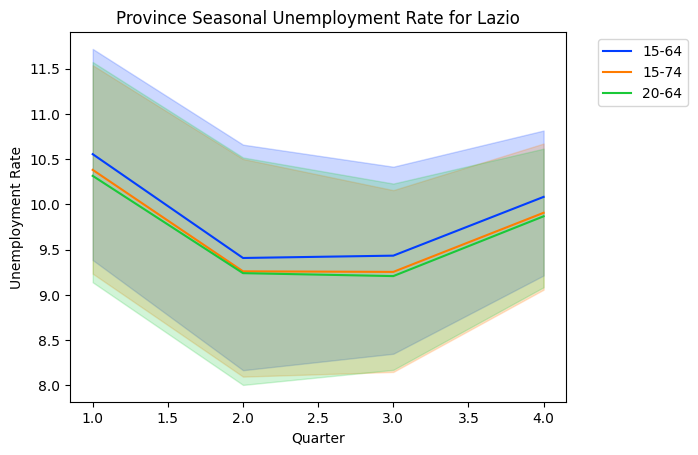

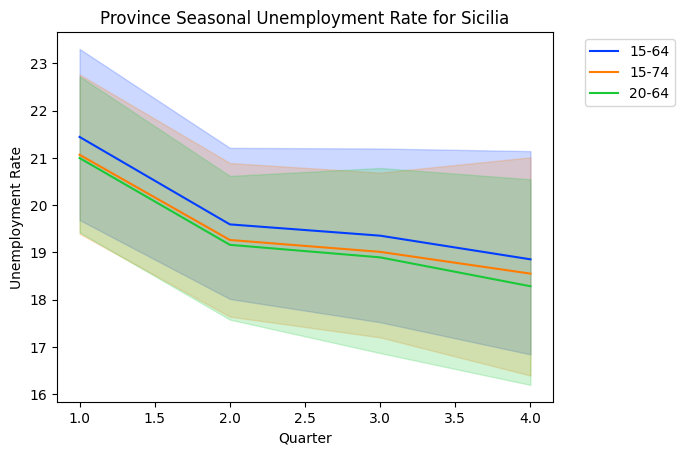

In [206]:
# What is the seasonal unemployment trend  for each Province, broken down various age groups?
provinces = df['Province'].unique()

# Loop through each province and create a line plot
for province in provinces:
    # Filter the dataframe for the current province
    province_df = df[df['Province'] == province]
    
    # Create the line plot
    plt.figure()
    sns.lineplot(x='Quarter', y='ProvinceUNEM_R', hue='age_range', data=province_df, palette='bright')
    plt.title(f'Province Seasonal Unemployment Rate for {province}')
    plt.xlabel('Quarter')
    plt.ylabel('Unemployment Rate')
    # Move the legend to the right side of the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

In [174]:
df.drop(columns=['Time_Period','age_range'],inplace=True)

In [176]:
df['Gender'].value_counts()

males      3240
females    3240
Name: Gender, dtype: int64

In [177]:
df.head(5)

,Country,Gender_ID,Gender,NationalUNEM_R,Lower_Age,Upper_Age,Province,ProvinceUNEM_R,Year,Quarter
0,Italy,1,males,27.731503,15,24,Nord,17.770927,2011,1
1,Italy,1,males,27.731503,15,24,Nord-ovest,19.687084,2011,1
2,Italy,1,males,27.731503,15,24,Nord-est,15.035054,2011,1
3,Italy,1,males,27.731503,15,24,Centro (I),28.585316,2011,1
4,Italy,1,males,27.731503,15,24,Mezzogiorno,39.233417,2011,1


In [180]:
# Convert the final data to a csv file
df.to_csv('unemployementbyprovinceseperatedbygender2011-2022.csv',index=False)